# GLASGOW UNIVERSITY EVENT SYSTEM TALK MODEL DESIGN

#This notebook presents the topic model for the Glasgow University Event Website. The topic model is designed based on the talk attributes like title, abstract and speaker affiliation. The key design principles used to implement this design are tfidf, LCA and t-SNE. For description of these principle see the project documentation.

What this program does:

    1. TFIDF t-SNE talk visualisation
    2. Word2Vec visualisation of word in all talks
    3. LDA modelling of topics for topic searching
    4. LDA modelling of topics for topic visualisation.

# Click the double arrowed button above and enter the academic year you want to visualise:

In [1]:
#It has to be a number NOT alphabetic
#It has to be equal to greater than 2012
#It has to be equal or less than the current year
#A valid pass returns the academic year , Not valid entry returns 0

#MAKE SURE YOU HAVE THE CORRECT DATABASE CONNECTION DETAILS!!!
#MAKE SURE YOUR NOTEBOOK HAS ALL THE REQUIRED MODULES INSTALLED!!!

In [2]:
#Import date library
import datetime
from datetime import datetime, timedelta
import numpy as np
# LDA, tSNE
from sklearn.manifold import TSNE
from gensim.models.ldamodel import LdaModel
# NLTK
from nltk.tokenize import RegexpTokenizer
from nltk.stem.snowball import SnowballStemmer
from nltk.corpus import stopwords
import re
# Visualization
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib
%matplotlib inline
import seaborn as sns
# Bokeh
from bokeh.io import output_notebook
from bokeh.plotting import figure, show
from bokeh.models import HoverTool, CustomJS, ColumnDataSource, Slider
from bokeh.layouts import column
from bokeh.palettes import all_palettes, Viridis256 
output_notebook()

C:\Users\User\Anaconda\lib\site-packages\gensim\utils.py:1209: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


Loading BokehJS ...

In [3]:
#Method to get the current year 
def this_year():
    year = datetime.now()
    year = year.year
    return year

#Method to validate the academic year number entered 
def year_entered():
    process = True
    while process:
        try:
            ACADEMIC_YEAR = int(input("Please enter the academic year you wish to visualise, between 2012 and this year: "))
            if ACADEMIC_YEAR >= 2012 and ACADEMIC_YEAR <= this_year():
                process = False
                print("correct")
                return ACADEMIC_YEAR
            if len(str(ACADEMIC_YEAR)) != 4:
                print("!!Ensure your academic year is a four digit number")
            if ACADEMIC_YEAR is None:
                print("!!Please enter an academic year")
            else:
                print("!!Enter a valid input")
        except:
            print ("!!Invalid input data, please enter the right data")

#Enter year now
year_entered = year_entered()


Please enter the academic year you wish to visualise, between 2012 and this year: 2017
correct


# Carry out test showing that only correct input year are accepted¶


In [4]:
#Unit test model
%load_ext ipython_unittest

In [5]:
%%unittest_main
class MyTest(unittest.TestCase):
    def test_range(self):
        range_year = year_entered >= 2012 and year_entered <= this_year()
        self.assertEqual(range_year, True)
    def test_digits(self):
        digit_check = len(str(year_entered)) == 4
        self.assertEqual(digit_check, True)
    def test_empty(self):
        test_empty = year_entered is None
        self.assertEqual(test_empty, False)


Success

...
----------------------------------------------------------------------
Ran 3 tests in 0.001s

OK


<unittest.runner.TextTestResult run=3 errors=0 failures=0>

# Please note: In other to get the data, you have to request access to the university's event database from the administrator responsible.

#You must use the correct host, port, username. password and database name. These will be provided by the administrator.

In [6]:
#Import libaries required to perform analysis

import pandas as pd
from pandas import Series,DataFrame
import numpy as np

# For visualization
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
%matplotlib inline

from __future__ import division

In [7]:
#Import the following required libraries for the natural landuage processing
import string
import os
import time
import _pickle as cPickle
import json
import wikipedia
import nltk
import numpy as np
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.manifold import TSNE
from sklearn.preprocessing import normalize
from sklearn.decomposition import TruncatedSVD

In [8]:
#We want to load the SQL data for talk, organisational group and location from MYSQL database
import MySQLdb

try:
    mysql_cn= MySQLdb.connect(host='127.0.0.1', port=33060,
                    user='readonlytalks', passwd='KAXV5wwC', 
                    db='talksdb_copy')

    talk_details = pd.read_sql("SELECT T.id, T.title,T.description, T.starttime, T.speakerAffiliation,T.owningOu,ou.name,ou.shortname FROM organisationalUnits AS ou INNER JOIN  talks  AS T ON T.owningOU = ou.id  INNER JOIN locations AS L ON T.location = L.id where T.starttime >="  +  "'" +str(year_entered)+ ".09.01'" + "AND" + " T.starttime <="  +  "'" +str(year_entered+1)+ ".09.01';" , con=mysql_cn)   
except: 
    traceback.print_exc()
    
#Now let's open the talk_details in a dataFrame
#First save as a csv to avoid the duplicate axis issues
#Also ensures quick accessibility and availability of data
dframe = DataFrame(talk_details)
dframe.to_csv('talk_Model'+str(year_entered)+'.csv')
talk_Model=pd.read_csv('talk_Model'+str(year_entered)+'.csv')

if talk_Model.empty:
    print("DataFrame is empty")
else:
    #Process the dataframe
    talk_Model = talk_Model.sort_values('starttime',ascending=True)
    talk_Model = talk_Model[talk_Model['title'] != "TBC"]
    talk_Model = talk_Model[talk_Model['title'] != "TBA"]
    talk_Model = talk_Model[talk_Model['title'] !="Get Your Feet Wet With SDN in a HARMLE$$ Way"]
    #Drop the unknow column
    talk_Model = talk_Model.drop(['Unnamed: 0'], axis=1)
    
#Display dataframe
talk_Model.head()

,id,title,description,starttime,speakerAffiliation,owningOu,name,shortname
28,2994,"Reliable, Secure and Scalable Software Systems...",http://www.dcs.gla.ac.uk/research/gpg/RS4/ The...,2017-09-01 00:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa
27,2993,"Reliable, Secure and Scalable Software Systems...","<p class=""c7""><span class=""c3 c2"">The era of m...",2017-09-01 07:45:00,"ARM, Codeplay, EPCC, Maidsafe, Twitter, and Un...",5,Systems Section,socs-systems
37,3008,CAS Scotland Conference 2017,What to EXPECT The conference brings together ...,2017-09-02 00:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa
19,2983,SICSA Education Workshop on Entrepreneurship.,SICSA is pleased to support the Education Work...,2017-09-05 09:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa
29,2995,"Silicon Valley Data Science ""Opportunities for...","<p>Join The Data Lab and John Akred, CTO of Si...",2017-09-07 08:30:00,The Data Lab,76,The Data Lab,datalab


In [9]:
#Import date library

import datetime
from datetime import datetime, timedelta

#Let's add the day value to the dataframe so we can order by days
#method to return actual date values
def days_Value (dateandtime):

    #dateandtime = talk_details['starttime']
    theday = dateandtime.str.split('-')
    year = int(theday[0][0])
    month = int(theday[0][1])
    day = int(theday[0][2][0:2])
    hour = int(theday[0][2][3:5])
    mins = int(theday[0][2][6:8])
    seconds = int(theday[0][2][9:11])

    #insert the dates into the datetime method
    a1 = datetime(year,month,day,hour,mins,seconds)

    a2 = datetime.now() - a1

    days = a2.days
    
    return days 


In [10]:
#Add new column - day_value
talk_Model['day_value'] = talk_Model[['starttime']].apply(days_Value,axis=1)

talk_Model.head()

,id,title,description,starttime,speakerAffiliation,owningOu,name,shortname,day_value
28,2994,"Reliable, Secure and Scalable Software Systems...",http://www.dcs.gla.ac.uk/research/gpg/RS4/ The...,2017-09-01 00:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,363
27,2993,"Reliable, Secure and Scalable Software Systems...","<p class=""c7""><span class=""c3 c2"">The era of m...",2017-09-01 07:45:00,"ARM, Codeplay, EPCC, Maidsafe, Twitter, and Un...",5,Systems Section,socs-systems,362
37,3008,CAS Scotland Conference 2017,What to EXPECT The conference brings together ...,2017-09-02 00:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,362
19,2983,SICSA Education Workshop on Entrepreneurship.,SICSA is pleased to support the Education Work...,2017-09-05 09:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,358
29,2995,"Silicon Valley Data Science ""Opportunities for...","<p>Join The Data Lab and John Akred, CTO of Si...",2017-09-07 08:30:00,The Data Lab,76,The Data Lab,datalab,356


In [11]:
#Methods to clean up the talks as shown below

import re
#Remove all tags
def cleanhtml(text):
        cleanr = re.compile('<.*?>')
        cleantext = re.sub(cleanr, '', str(text))
        return cleantext
    
#Remove all and sysmbols
def cleanhtml1(text):
    cleantext=str(text)
    cleantext = text.replace('&amp;', ' ')
    cleantext = text.replace('&nbsp;', ' ')
    return cleantext

#Reomve all website links
def cleanURLs(text):
    cleantext=str(text)
    text = re.sub(r'^https?:\/\/.*[\r\n]*', '', text, flags=re.MULTILINE)
    return text

#Process the text
def processText(text):
    for i, description in enumerate(text):
        clean_text = cleanhtml(description)
        clean_text = cleanhtml1(clean_text)
        clean_text = cleanURLs(clean_text)
        return str(clean_text)


#Add new column - clean description 
talk_Model['clean_description'] = talk_Model[['description']].apply(processText,axis=1)

talk_Model.head()

,id,title,description,starttime,speakerAffiliation,owningOu,name,shortname,day_value,clean_description
28,2994,"Reliable, Secure and Scalable Software Systems...",http://www.dcs.gla.ac.uk/research/gpg/RS4/ The...,2017-09-01 00:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,363,
27,2993,"Reliable, Secure and Scalable Software Systems...","<p class=""c7""><span class=""c3 c2"">The era of m...",2017-09-01 07:45:00,"ARM, Codeplay, EPCC, Maidsafe, Twitter, and Un...",5,Systems Section,socs-systems,362,The era of many-core computing is transforming...
37,3008,CAS Scotland Conference 2017,What to EXPECT The conference brings together ...,2017-09-02 00:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,362,What to EXPECT The conference brings together ...
19,2983,SICSA Education Workshop on Entrepreneurship.,SICSA is pleased to support the Education Work...,2017-09-05 09:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,358,SICSA is pleased to support the Education Work...
29,2995,"Silicon Valley Data Science ""Opportunities for...","<p>Join The Data Lab and John Akred, CTO of Si...",2017-09-07 08:30:00,The Data Lab,76,The Data Lab,datalab,356,"Join The Data Lab and John Akred, CTO of Silic..."


In [12]:
#Now let make the talk_model id column the index

talk_Model['refID'] = talk_Model['id']

talk_Model.set_index('id', inplace=True)

talk_Model.head()

,title,description,starttime,speakerAffiliation,owningOu,name,shortname,day_value,clean_description,refID
id,,,,,,,,,,
2994,"Reliable, Secure and Scalable Software Systems...",http://www.dcs.gla.ac.uk/research/gpg/RS4/ The...,2017-09-01 00:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,363,,2994
2993,"Reliable, Secure and Scalable Software Systems...","<p class=""c7""><span class=""c3 c2"">The era of m...",2017-09-01 07:45:00,"ARM, Codeplay, EPCC, Maidsafe, Twitter, and Un...",5,Systems Section,socs-systems,362,The era of many-core computing is transforming...,2993
3008,CAS Scotland Conference 2017,What to EXPECT The conference brings together ...,2017-09-02 00:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,362,What to EXPECT The conference brings together ...,3008
2983,SICSA Education Workshop on Entrepreneurship.,SICSA is pleased to support the Education Work...,2017-09-05 09:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,358,SICSA is pleased to support the Education Work...,2983
2995,"Silicon Valley Data Science ""Opportunities for...","<p>Join The Data Lab and John Akred, CTO of Si...",2017-09-07 08:30:00,The Data Lab,76,The Data Lab,datalab,356,"Join The Data Lab and John Akred, CTO of Silic...",2995


In [13]:
#Now let's set up a  token dictionary
token_dict = {}


#Scan through title and count them and store their content in variable article
for i, talkID in enumerate(talk_Model['refID']):
        #Check is the title is already in the dictionary
        if talkID  not in token_dict: 
            try:
                #The contents of the article and store them in the 
                token_dict[talkID ] = talk_Model.loc[talkID]['clean_description']
            except:
                #Print message if there is a processing isssue
                print (" ==> error processing "+talkID)

#print(token_dict)

In [14]:
#Save the titles in a dictionary
#To retrieve later
cPickle.dump(token_dict, open("talk_Model.p", "wb" ))

In [15]:
#Now time for some natural language processing
import nltk
nltk.download('punkt')
nltk.download('stopwords')

#define a function which converts raw text into vector and tokens
def tokenize(text):
    #Make all text lower case
    text = text.lower() # lower case
    ## remove punctuation and line breaks/tabs
    for e in set(string.punctuation+'\n'+'\t'):
        #Remove all space
        text = text.replace(e, ' ')
    # remove double spaces
    for i in range(0,10):
        text = text.replace('  ', ' ')
     # remove punctuation
    text = text.translate(string.punctuation)
    #Make the text tokens
    tokens = nltk.word_tokenize(text)
    #Using list comprehension get only words not in stop words
    text = [w for w in tokens if not w in stopwords.words('english')] # stopwords
    #Define a list
    stems = []
    #Stems the words For example running to run
    #Then return the stem
    for item in tokens: # stem
        stems.append(PorterStemmer().stem(item))
    return stems

#Get the dictionary values
dict_values = token_dict.values()

# Let's write a function that will calculate tfidf (might take a while)
def vectorise_transform(dict):
    print ("calculating tf-idf")
    #The tokinize method returns the stems words
    #The tfidf vectoriser function receives the stem words as parameter
    #And also the stop-words
    tfidf = TfidfVectorizer(tokenizer=tokenize, stop_words='english')
    print(tfidf)
    #Perform perform a dimensionality reduction with SVD
    #tfs = TruncatedSVD(n_components=1000, random_state=0).fit_transform(tfs)
    #Get the tfidf
    tfs = tfidf.fit_transform(dict)
    print(tfs)
    #Reduce to 1000 dimnesions
    print ("reducing tf-idf to 1000 dim")
    tfs_reduced = TruncatedSVD(n_components=1000, random_state=0).fit_transform(tfs)
    print(tfs_reduced)
    return tfs_reduced 

#Number preform the vectorisation and transformation
vectorise_transform(dict_values)

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
calculating tf-idf
TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 1), norm='l2', preprocessor=None, smooth_idf=True,
        stop_words='english', strip_accents=None, sublinear_tf=False,
        token_pattern='(?u)\\b\\w\\w+\\b',
        tokenizer=<function tokenize at 0x00000230D8A34400>, use_idf=True,
        vocabulary=None)
  (1, 2303)	0.10644644606029156
  (1, 3986)	0.10575275130144343
  (1, 1577)	0.22695244275254095
  (1, 1475)	0.3084939728866463
  (1, 6716)	0.08592524232649822
  (1, 648)	0.0568

array([[-4.01243595e-16,  1.43085277e-16, -1.55901891e-17, ...,
         0.00000000e+00, -2.09681802e-32,  4.13637159e-28],
       [ 3.32399912e-01,  1.80133472e-15,  1.16062278e-01, ...,
        -7.82675539e-33, -2.03382945e-33,  7.73495629e-45],
       [ 2.81416783e-01,  4.00296604e-16,  1.35920130e-01, ...,
         1.03755291e-32,  8.50215145e-34,  1.34331781e-43],
       ...,
       [ 2.16623746e-01,  4.68960880e-16, -2.85158970e-02, ...,
        -1.06571440e-32,  4.22140129e-34, -8.91874774e-44],
       [ 1.86672452e-01,  2.97675087e-16,  1.29048650e-01, ...,
         4.30537987e-33, -1.07359095e-33,  1.11323881e-44],
       [ 1.95043673e-01,  4.86641929e-17, -3.04598573e-02, ...,
        -2.23640566e-32,  3.16735387e-33, -5.72643105e-44]])

In [16]:
#See contents of the dictionary
#dict_values
#token_dict

In [17]:
#Display the size of the tfidf
tfs_transform=vectorise_transform(dict_values)
print ("size of TSVD: "+str(tfs_transform.shape))
#P

tfs_transform

calculating tf-idf
TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 1), norm='l2', preprocessor=None, smooth_idf=True,
        stop_words='english', strip_accents=None, sublinear_tf=False,
        token_pattern='(?u)\\b\\w\\w+\\b',
        tokenizer=<function tokenize at 0x00000230D8A34400>, use_idf=True,
        vocabulary=None)
  (1, 2303)	0.10644644606029156
  (1, 3986)	0.10575275130144343
  (1, 1577)	0.22695244275254095
  (1, 1475)	0.3084939728866463
  (1, 6716)	0.08592524232649822
  (1, 648)	0.056885996507370744
  (1, 3829)	0.06582381366547362
  (1, 452)	0.08358729436886622
  (1, 5837)	0.07565081425084698
  (1, 4467)	0.11061459011405285
  (1, 3453)	0.09546705867597
  (1, 905)	0.08150968797208667
  (1, 1732)	0.22372490162305256
  (1, 3582)	0.07877125168022552
  (1, 2371)	0.054195455638202335
  (1, 6050)

array([[-4.01243595e-16,  1.43085277e-16, -1.55901891e-17, ...,
         0.00000000e+00, -2.09681802e-32,  4.13637159e-28],
       [ 3.32399912e-01,  1.80133472e-15,  1.16062278e-01, ...,
        -7.82675539e-33, -2.03382945e-33,  7.73495629e-45],
       [ 2.81416783e-01,  4.00296604e-16,  1.35920130e-01, ...,
         1.03755291e-32,  8.50215145e-34,  1.34331781e-43],
       ...,
       [ 2.16623746e-01,  4.68960880e-16, -2.85158970e-02, ...,
        -1.06571440e-32,  4.22140129e-34, -8.91874774e-44],
       [ 1.86672452e-01,  2.97675087e-16,  1.29048650e-01, ...,
         4.30537987e-33, -1.07359095e-33,  1.11323881e-44],
       [ 1.95043673e-01,  4.86641929e-17, -3.04598573e-02, ...,
        -2.23640566e-32,  3.16735387e-33, -5.72643105e-44]])

# [1.1] TALK MODEL USING TFIDF and T-SNE for this academic year (Initial)

In [18]:
#Let's now implement t-SNE
#model = TSNE(n_components=2, perplexity=50, verbose=2).fit_transform(tfs.todense())
print(__doc__)
#Import all required libraries
from time import time
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import NullFormatter
from sklearn import manifold, datasets

#Now write a method to plot the tSNE plot
#Set the start time
t0 = time()
#Perform tsne with the reduced tfidf
model = TSNE(n_components=2, perplexity=1, verbose=5).fit_transform(tfs_transform)

#set stop time
t1 = time()


Automatically created module for IPython interactive environment
[t-SNE] Computing 4 nearest neighbors...
[t-SNE] Indexed 548 samples in 0.000s...
[t-SNE] Computed neighbors for 548 samples in 0.318s...
[t-SNE] Computed conditional probabilities for sample 548 / 548
[t-SNE] Mean sigma: 0.000000
[t-SNE] Computed conditional probabilities in 0.031s
[t-SNE] Iteration 50: error = 136.3052368, gradient norm = 0.2592897 (50 iterations in 0.436s)
[t-SNE] Iteration 100: error = 153.2989807, gradient norm = 0.1611001 (50 iterations in 0.545s)
[t-SNE] Iteration 150: error = 145.9919128, gradient norm = 0.2027137 (50 iterations in 0.516s)
[t-SNE] Iteration 200: error = 142.0451660, gradient norm = 0.4424451 (50 iterations in 0.587s)
[t-SNE] Iteration 250: error = 152.6359863, gradient norm = 0.1312069 (50 iterations in 0.502s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 152.635986
[t-SNE] Iteration 300: error = 4.6767950, gradient norm = 0.0111496 (50 iterations in 0.441s)

In [19]:
#Build the tSNE dataframe for the visualisation
tfModel = pd.DataFrame(model, columns=('x','y'))

tfModel['hue'] = talk_Model['shortname'].values

tfModel['hue1'] = talk_Model['title'].values

factor = pd.factorize(talk_Model['shortname'])

values_factor= pd.Series(factor[0][0:])

values_factor = DataFrame(values_factor)

tfModel['hue_factor'] = values_factor.values

tfModel['time'] = talk_Model['starttime'].values

tfModel['ref'] = talk_Model['refID'].values

tfModel.head()

,x,y,hue,hue1,hue_factor,time,ref
0,2.314983,-15.015567,sicsa,"Reliable, Secure and Scalable Software Systems...",0,2017-09-01 00:00:00,2994
1,-0.829156,-27.652105,socs-systems,"Reliable, Secure and Scalable Software Systems...",1,2017-09-01 07:45:00,2993
2,4.467421,-8.160336,sicsa,CAS Scotland Conference 2017,0,2017-09-02 00:00:00,3008
3,8.214404,-19.831669,sicsa,SICSA Education Workshop on Entrepreneurship.,0,2017-09-05 09:00:00,2983
4,-16.205534,45.721645,datalab,"Silicon Valley Data Science ""Opportunities for...",2,2017-09-07 08:30:00,2995


In [20]:
#Built an array of colours for each series in the visualisation
from random import randint
colors = []

for i in range(len(tfModel)):
    colors.append('%06X' % randint(0, 0xFFFFFF))

colors[0:4]

d = {'colour': [colors][0]}
colors = pd.DataFrame(data=d)
colors.head()

#Make the t-SNE table to array in ascending order of the hue factorisation
#This is to properly allocate colours to different organisational group
tfModel = tfModel.sort_values('hue_factor',ascending=True)
tfModel.head()

,x,y,hue,hue1,hue_factor,time,ref
0,2.314983,-15.015567,sicsa,"Reliable, Secure and Scalable Software Systems...",0,2017-09-01 00:00:00,2994
369,2.464935,-13.106855,sicsa,Data-driven Modelling and Analysis of Complex ...,0,2018-03-19 10:00:00,8822
40,2.319386,-15.012481,sicsa,SICSA DemoFest 2017,0,2017-10-03 15:00:00,2738
42,45.810692,21.828110,sicsa,SICSA DemoFest 2017: Bringing Research to Life,0,2017-10-03 15:00:00,8286
343,0.218102,-16.459459,sicsa,Scottish Programming Languages Seminar (SPLS),0,2018-03-07 13:00:00,8419


In [21]:
#Add the colours to the array
i=0
data = []
for hue1 in tfModel['hue_factor'][0:len(tfModel)]:
    if hue1 == i:
        data.append("#"+colors.loc[i]['colour'])
        #print(hue1,colors.loc[i]['colour'])
        
    else:
        i=i+1
        data.append("#"+colors.loc[i]['colour'])
        #print(hue1,colors.loc[i]['colour']) 
        
        


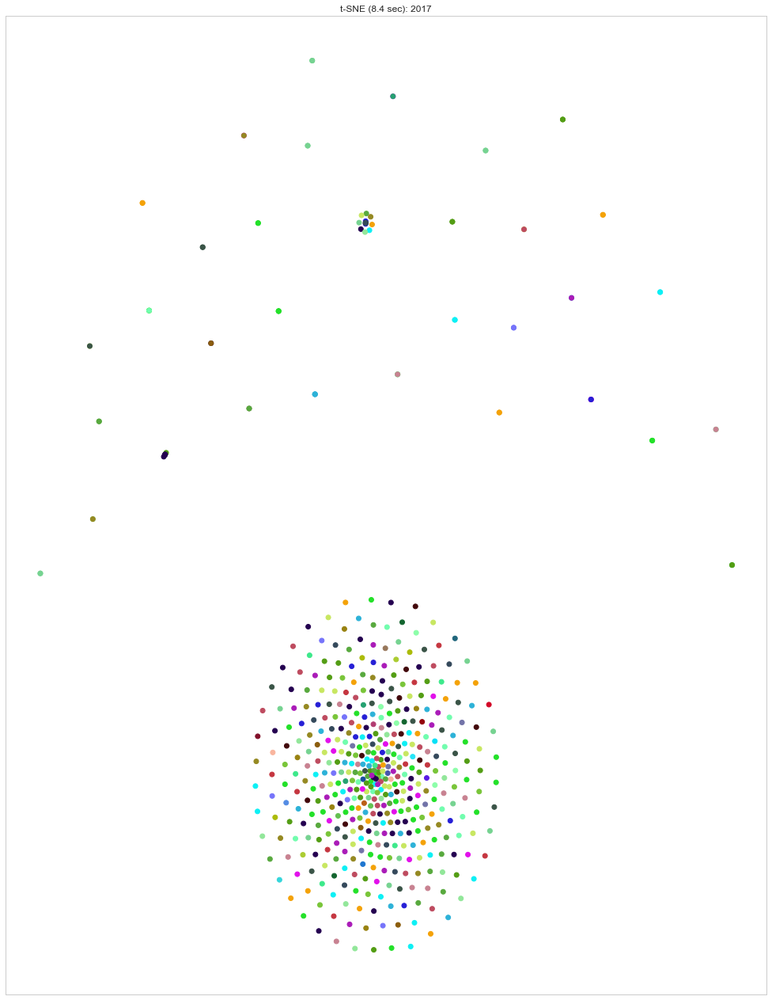

In [22]:
#Now plot the TSNE model
def plotTSNE():
    df = pd.DataFrame( index = tfModel['hue'],columns=['x', 'y'])
    df['x'] = tfModel['x'].values
    df['y'] = tfModel['y'].values
    
    #Define points
    n_points = len(talk_Model)
    #Generates points and colour
   # X, color = datasets.samples_generator.make_s_curve(n_points, random_state=572)

    #Plot the figures of the tsne model
    fig = plt.figure(figsize=(100,50))
    ax = fig.add_subplot(2, 5, 10)
    plt.scatter(model[:, 0], model[:, 1], c=data, cmap=plt.cm.Spectral )
    plt.title("t-SNE (%.2g sec): " % (t1 - t0) + str(year_entered))
    ax.grid(False)
    ax.xaxis.set_major_formatter(NullFormatter())
    ax.yaxis.set_major_formatter(NullFormatter())
    return plt.show()

plotTSNE()

# [1.2] TALK MODEL USING TFIDF and T-SNE showing titles 

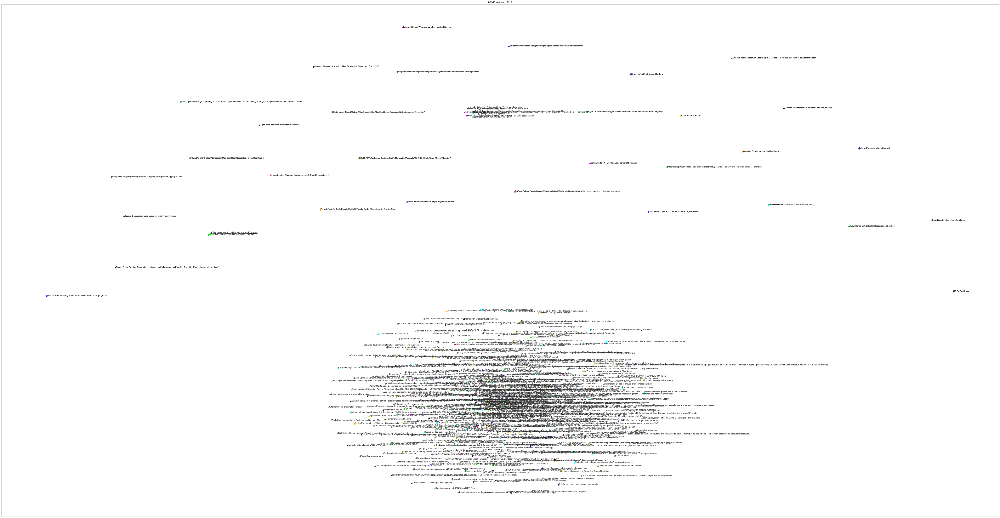

In [23]:
#Plot t-SNE with the labels

def plotwithLabel():
    df = pd.DataFrame( index = tfModel['hue1'],columns=['x', 'y'])
    df['x'] = tfModel['x'].values
    df['y'] = tfModel['y'].values
    
    #Generates points and colour
    n_points =len(talk_Model)
    #Generates points and colour
    #X, color = datasets.samples_generator.make_s_curve(n_points, random_state=572)
    
    #Now let's print out the t-SNE visualisation which incorporated tfidf and TruncatedSVD
    fig = plt.figure(figsize=(500,100))
    ax = fig.add_subplot(2, 5, 10)
    for word, pos in df.iterrows():
        ax.annotate(word, pos)
    plt.scatter(df['x'], df['y'], c=data, cmap=plt.cm.Spectral )
    plt.title("t-SNE (%.2g sec): " % (t1 - t0) + str(year_entered))
    ax.xaxis.set_major_formatter(NullFormatter())
    ax.yaxis.set_major_formatter(NullFormatter())
    ax.grid(False)
    
    
    #Save to model to JSON file
    tfModel.to_json('tfidf-tSNE'+str(year_entered)+'.json')
    return plt.show()

plotwithLabel()

# [1.3] TALK MODEL USING TFIDF and T-SNE showing series short name for this academic year


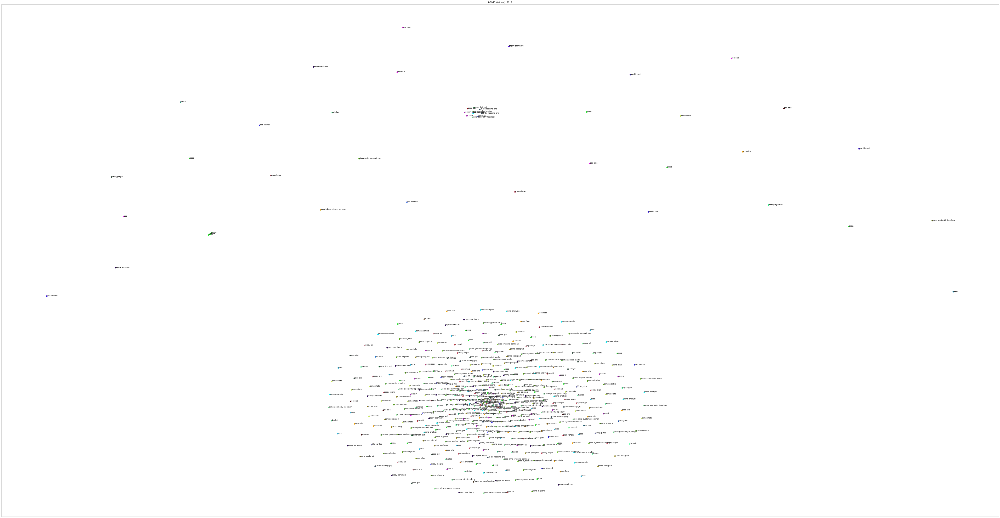

In [24]:
#Plot t-SNE with the labels (shortnames)

def plotwithLabel1():
    df = pd.DataFrame( index = tfModel['hue'],columns=['x', 'y'])
    df['x'] = tfModel['x'].values
    df['y'] = tfModel['y'].values
    
    #Generates points and colour
    n_points =len(talk_Model)
    #Generates points and colour
    #X, color = datasets.samples_generator.make_s_curve(n_points, random_state=572)
    
    #Now let's print out the t-SNE visualisation which incorporated tfidf and TruncatedSVD
    fig = plt.figure(figsize=(500,100))
    ax = fig.add_subplot(2, 5, 10)
    for word, pos in df.iterrows():
        ax.annotate(word, pos)
    plt.scatter(df['x'], df['y'], c=data, cmap=plt.cm.Spectral )
    plt.title("t-SNE (%.2g sec): " % (t1 - t0) + str(year_entered))
    ax.xaxis.set_major_formatter(NullFormatter())
    ax.yaxis.set_major_formatter(NullFormatter())
    ax.grid(False)
    return plt.show()

plotwithLabel1()

In [25]:
#Now plot the tSNE interactive model
from bokeh.models import ColumnDataSource, OpenURL, TapTool
from bokeh.plotting import figure, show

source = ColumnDataSource(data=dict(
    x = tfModel.x,
            y = tfModel.y,
            colors = data,
            title = tfModel['hue1'],
            series = tfModel['hue'],
            time = tfModel['time'],
            link = tfModel['ref'],
            alpha = [0.9] * model.shape[0],
            size = [7] * model.shape[0]
    ))


hover_tsne = HoverTool(names=["df"], tooltips="""
    <div style="margin: 10">
        <div style="margin: 0 auto; width:300px;">
            <span style="font-size: 12px; font-weight: bold;">Title:</span>
            <span style="font-size: 12px">@title</span>
            <br>
            <span style="font-size: 12px; font-weight: bold;">Series:</span>
            <span style="font-size: 12px">@series</span>
             <br>
             <span style="font-size: 12px; font-weight: bold;">Time:</span>
            <span style="font-size: 12px">@time</span>
             <br>
             <span style="font-size: 12px; font-weight: bold;">Reference:</span>
            <span style="font-size: 12px">@link</span>
        </div>
    </div>
    """)

#p.circle('x', 'y', color='colors', size=7, source=source)
tools_tsne = [hover_tsne, 'pan', 'wheel_zoom', 'reset','tap']

plot_tsne = figure(plot_width=1000, plot_height=1000, tools=tools_tsne, title='talks')


plot_tsne.circle('x', 'y', size='size', fill_color='colors', 
                 alpha='alpha', line_alpha=0, line_width=0.01, source=source, name="df")



plot_tsne.xgrid.visible = False
plot_tsne.ygrid.visible = False
url = "https://samoa.dcs.gla.ac.uk/events/viewtalk.jsp?id=@link/"
taptool = plot_tsne.select(type=TapTool)
taptool.callback = OpenURL(url=url)

show(plot_tsne)

# [1.6] Modified TALK MODEL USING TFIDF and T-SNE and HASH injection (The Prince's Model)  

In [26]:
#Let's view the talk dataframe for the hash injection
talk_Model2= talk_Model

talk_Model2.head()

,title,description,starttime,speakerAffiliation,owningOu,name,shortname,day_value,clean_description,refID
id,,,,,,,,,,
2994,"Reliable, Secure and Scalable Software Systems...",http://www.dcs.gla.ac.uk/research/gpg/RS4/ The...,2017-09-01 00:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,363,,2994
2993,"Reliable, Secure and Scalable Software Systems...","<p class=""c7""><span class=""c3 c2"">The era of m...",2017-09-01 07:45:00,"ARM, Codeplay, EPCC, Maidsafe, Twitter, and Un...",5,Systems Section,socs-systems,362,The era of many-core computing is transforming...,2993
3008,CAS Scotland Conference 2017,What to EXPECT The conference brings together ...,2017-09-02 00:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,362,What to EXPECT The conference brings together ...,3008
2983,SICSA Education Workshop on Entrepreneurship.,SICSA is pleased to support the Education Work...,2017-09-05 09:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,358,SICSA is pleased to support the Education Work...,2983
2995,"Silicon Valley Data Science ""Opportunities for...","<p>Join The Data Lab and John Akred, CTO of Si...",2017-09-07 08:30:00,The Data Lab,76,The Data Lab,datalab,356,"Join The Data Lab and John Akred, CTO of Silic...",2995


In [27]:
#Let's write a method to inject some "series hash-string" into the abstract 
#This is to optimise the accuracy of the talk model by keeping similar talk together while also retaining the orginating series 
#characteristics

#Mehtod for inserting hash-string
def seriesHash(hashString):
    hashedAbstract = hashString.str.replace(' ',"")
    return hashedAbstract

talk_Model2['hashedDescription'] = talk_Model2[['name']].apply(seriesHash,axis=1)

talk_Model2.head()

,title,description,starttime,speakerAffiliation,owningOu,name,shortname,day_value,clean_description,refID,hashedDescription
id,,,,,,,,,,,
2994,"Reliable, Secure and Scalable Software Systems...",http://www.dcs.gla.ac.uk/research/gpg/RS4/ The...,2017-09-01 00:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,363,,2994,ScottishInformaticsandComputerScienceAlliance(...
2993,"Reliable, Secure and Scalable Software Systems...","<p class=""c7""><span class=""c3 c2"">The era of m...",2017-09-01 07:45:00,"ARM, Codeplay, EPCC, Maidsafe, Twitter, and Un...",5,Systems Section,socs-systems,362,The era of many-core computing is transforming...,2993,SystemsSection
3008,CAS Scotland Conference 2017,What to EXPECT The conference brings together ...,2017-09-02 00:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,362,What to EXPECT The conference brings together ...,3008,ScottishInformaticsandComputerScienceAlliance(...
2983,SICSA Education Workshop on Entrepreneurship.,SICSA is pleased to support the Education Work...,2017-09-05 09:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,358,SICSA is pleased to support the Education Work...,2983,ScottishInformaticsandComputerScienceAlliance(...
2995,"Silicon Valley Data Science ""Opportunities for...","<p>Join The Data Lab and John Akred, CTO of Si...",2017-09-07 08:30:00,The Data Lab,76,The Data Lab,datalab,356,"Join The Data Lab and John Akred, CTO of Silic...",2995,TheDataLab


In [28]:
#Aadd the hashed string into the dataframe

talk_Model2['Description1'] = talk_Model2['clean_description'] +" "+ talk_Model2['hashedDescription']

talk_Model2.head()

,title,description,starttime,speakerAffiliation,owningOu,name,shortname,day_value,clean_description,refID,hashedDescription,Description1
id,,,,,,,,,,,,
2994,"Reliable, Secure and Scalable Software Systems...",http://www.dcs.gla.ac.uk/research/gpg/RS4/ The...,2017-09-01 00:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,363,,2994,ScottishInformaticsandComputerScienceAlliance(...,ScottishInformaticsandComputerScienceAlliance...
2993,"Reliable, Secure and Scalable Software Systems...","<p class=""c7""><span class=""c3 c2"">The era of m...",2017-09-01 07:45:00,"ARM, Codeplay, EPCC, Maidsafe, Twitter, and Un...",5,Systems Section,socs-systems,362,The era of many-core computing is transforming...,2993,SystemsSection,The era of many-core computing is transforming...
3008,CAS Scotland Conference 2017,What to EXPECT The conference brings together ...,2017-09-02 00:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,362,What to EXPECT The conference brings together ...,3008,ScottishInformaticsandComputerScienceAlliance(...,What to EXPECT The conference brings together ...
2983,SICSA Education Workshop on Entrepreneurship.,SICSA is pleased to support the Education Work...,2017-09-05 09:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,358,SICSA is pleased to support the Education Work...,2983,ScottishInformaticsandComputerScienceAlliance(...,SICSA is pleased to support the Education Work...
2995,"Silicon Valley Data Science ""Opportunities for...","<p>Join The Data Lab and John Akred, CTO of Si...",2017-09-07 08:30:00,The Data Lab,76,The Data Lab,datalab,356,"Join The Data Lab and John Akred, CTO of Silic...",2995,TheDataLab,"Join The Data Lab and John Akred, CTO of Silic..."


In [29]:
#Now let's set up a  token dictionary
token_dict = {}


#Scan through title and count them and store their content in variable article
for i, talkID in enumerate(talk_Model2['refID']):
        #Check is the title is already in the dictionary
        if talkID  not in token_dict: 
            try:
                #The contents of the article and store them in the 
                token_dict[talkID ] = talk_Model2.loc[talkID]['Description1']
            except:
                #Print message if there is a processing isssue
                print (" ==> error processing "+talkID)

#print(token_dict)

In [30]:
#Save the titles in a dictionary
#To retrieve later
#token_dict = pickle.load(open("talk_Model.p", "r" ))
#
cPickle.dump(token_dict, open("talk_Model2.p", "wb" ))

In [31]:
#Get the dictionary values

if talk_Model2.empty:
    print("No Topics available")
else:
    dict_values = token_dict.values()
    #Display the size of the tfidf
    tfs_transform2=vectorise_transform(dict_values)
    print ("size of TSVD: "+str(tfs_transform2.shape))
    #P
    tfs_transform2

calculating tf-idf
TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 1), norm='l2', preprocessor=None, smooth_idf=True,
        stop_words='english', strip_accents=None, sublinear_tf=False,
        token_pattern='(?u)\\b\\w\\w+\\b',
        tokenizer=<function tokenize at 0x00000230D8A34400>, use_idf=True,
        vocabulary=None)
  (0, 5827)	0.7071067811865475
  (0, 5984)	0.7071067811865475
  (1, 2325)	0.10565895204600796
  (1, 4018)	0.10497038926188094
  (1, 1590)	0.22527344174490338
  (1, 1486)	0.30621172518292117
  (1, 6771)	0.08528956479556724
  (1, 653)	0.0564651521917161
  (1, 3861)	0.06533684710926263
  (1, 454)	0.08296891304734835
  (1, 5886)	0.07509114724830113
  (1, 4501)	0.10979626004450865
  (1, 3485)	0.09476079050027153
  (1, 911)	0.08090667684527286
  (1, 1748)	0.22139061695481585
  (1, 3614)	

# [1.7] Now let's plot the Modified TFIDF t-SNE MODEL with the HASH injection (The Prince's Model)

In [32]:
#Let's now implement t-SNE
#model = TSNE(n_components=2, perplexity=50, verbose=2).fit_transform(tfs.todense())
print(__doc__)
#Import all required libraries
from time import time
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import NullFormatter
from sklearn import manifold, datasets

Automatically created module for IPython interactive environment


In [33]:
#Ensuring that the dataframe is not empty before running the t-SNE model 
if talk_Model2.empty:
    print("No Topics available")
else:
    #Now write a method to plot the tSNE chart
    #Set the start time
    t0 = time()
    #Perform tsne with the reduced tfidf
    model2 = TSNE(n_components=2, perplexity=1, verbose=10).fit_transform(tfs_transform2)
    #set stop time


[t-SNE] Computing 4 nearest neighbors...
[t-SNE] Indexed 548 samples in 0.302s...
[t-SNE] Computed neighbors for 548 samples in 0.389s...
[t-SNE] Computed conditional probabilities for sample 548 / 548
[t-SNE] Mean sigma: 0.000000
[t-SNE] Computed conditional probabilities in 0.109s
[t-SNE] Iteration 50: error = 105.4565277, gradient norm = 0.3989271 (50 iterations in 0.968s)
[t-SNE] Iteration 100: error = 98.8201065, gradient norm = 0.4156761 (50 iterations in 0.451s)
[t-SNE] Iteration 150: error = 95.7285080, gradient norm = 0.4127719 (50 iterations in 0.487s)
[t-SNE] Iteration 200: error = 93.7311401, gradient norm = 0.4072735 (50 iterations in 0.469s)
[t-SNE] Iteration 250: error = 91.2576599, gradient norm = 0.4620720 (50 iterations in 0.422s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 91.257660
[t-SNE] Iteration 300: error = 2.1078753, gradient norm = 0.0219749 (50 iterations in 0.554s)
[t-SNE] Iteration 350: error = 1.6372427, gradient norm = 0.0071287 (

In [34]:
#Build the t-SNE model data frame

tfModel2 = pd.DataFrame(model2, columns=('x','y'))

tfModel2['hue'] = talk_Model['shortname'].values

tfModel2['hue1'] = talk_Model['title'].values

factor = pd.factorize(talk_Model['shortname'])

values_factor= pd.Series(factor[0][0:])

values_factor = DataFrame(values_factor)

tfModel2['hue_factor'] = values_factor.values

tfModel2['time'] = talk_Model['starttime'].values

tfModel2['ref'] = talk_Model['refID'].values


In [35]:
#View the dataframe
tfModel2.head()

,x,y,hue,hue1,hue_factor,time,ref
0,16.299212,39.755684,sicsa,"Reliable, Secure and Scalable Software Systems...",0,2017-09-01 00:00:00,2994
1,6.441720,-14.165054,socs-systems,"Reliable, Secure and Scalable Software Systems...",1,2017-09-01 07:45:00,2993
2,67.043076,13.745799,sicsa,CAS Scotland Conference 2017,0,2017-09-02 00:00:00,3008
3,64.984444,20.025173,sicsa,SICSA Education Workshop on Entrepreneurship.,0,2017-09-05 09:00:00,2983
4,-3.875155,93.631027,datalab,"Silicon Valley Data Science ""Opportunities for...",2,2017-09-07 08:30:00,2995


In [36]:
#Set the t-SNE  model in ascending order
tfModel2 = tfModel2.sort_values('hue_factor',ascending=True)
tfModel2.head()


,x,y,hue,hue1,hue_factor,time,ref
0,16.299212,39.755684,sicsa,"Reliable, Secure and Scalable Software Systems...",0,2017-09-01 00:00:00,2994
369,48.080090,20.895191,sicsa,Data-driven Modelling and Analysis of Complex ...,0,2018-03-19 10:00:00,8822
40,16.298153,39.751122,sicsa,SICSA DemoFest 2017,0,2017-10-03 15:00:00,2738
42,39.439522,38.522293,sicsa,SICSA DemoFest 2017: Bringing Research to Life,0,2017-10-03 15:00:00,8286
343,-25.895956,12.625941,sicsa,Scottish Programming Languages Seminar (SPLS),0,2018-03-07 13:00:00,8419


In [37]:
#Method plot the t-SNE model
def plotTSNE1():
    df = pd.DataFrame( index = tfModel2['hue'],columns=['x', 'y'])
    df['x'] = tfModel2['x'].values
    df['y'] = tfModel2['y'].values
    
    #Define points
    n_points = len(talk_Model2)
    #Generates points and colour
    #X, color = datasets.samples_generator.make_s_curve(n_points, random_state=572)

    #Plot the figures of the tsne model
    fig = plt.figure(figsize=(100,50))
    ax = fig.add_subplot(2, 5, 10)
    plt.scatter(df['x'], df['y'], c=data, cmap=plt.cm.Spectral )
    plt.title("t-SNE (%.2g sec): " % (t1 - t0) + str(year_entered))
    ax.xaxis.set_major_formatter(NullFormatter())
    ax.yaxis.set_major_formatter(NullFormatter())
    ax.grid(False)
    return plt.show()

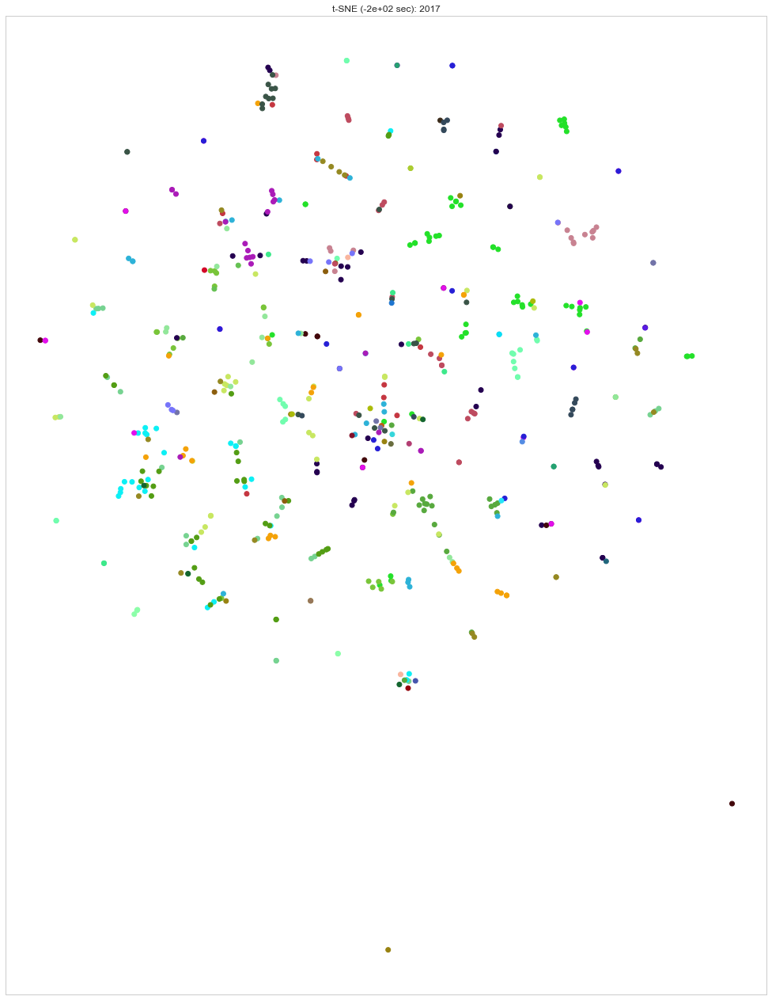

In [38]:
#Plot the t-SNE model
plotTSNE1()

# [1.8] Now let's add the talk titles to the Modified TFIDF t-SNE MODEL with the HASH injection (The Prince's Model) 

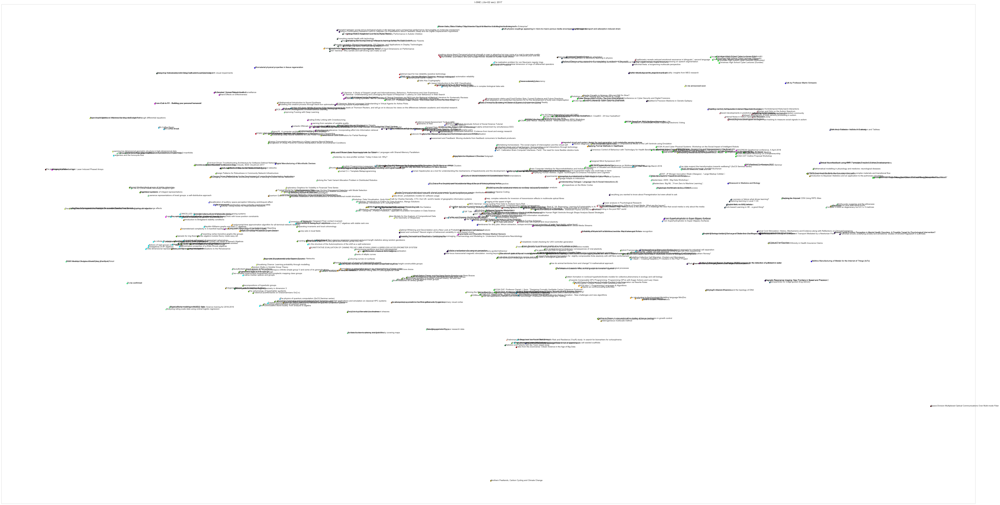

In [39]:
#Plot t-SNE with the labels

def plotwithLabel():
    df = pd.DataFrame( index = tfModel2['hue1'],columns=['x', 'y'])
    df['x'] = tfModel2['x'].values
    df['y'] = tfModel2['y'].values
    
    #Generates points and colour
    n_points =len(talk_Model2)
    #Generates points and colour
    #X, color = datasets.samples_generator.make_s_curve(n_points, random_state=572)
    
    #Now let's print out the t-SNE visualisation which incorporated tfidf and TruncatedSVD
    fig = plt.figure(figsize=(500,100))
    ax = fig.add_subplot(2, 5, 10)
    for word, pos in df.iterrows():
        ax.annotate(word, pos)
    plt.scatter(df['x'], df['y'], c=data, cmap=plt.cm.Spectral )
    plt.title("t-SNE (%.2g sec): " % (t1 - t0) + str(year_entered))
    ax.xaxis.set_major_formatter(NullFormatter())
    ax.yaxis.set_major_formatter(NullFormatter())
    ax.grid(False)
    
    #talk_Model2['x'] = df['x']
    #talk_Model2['y'] = df['y'] 
    
    #Save to model to JSON file
    tfModel2.to_json('tfidf-tSNE-Hash'+str(year_entered)+'.json')
    
    return plt.show()

plotwithLabel()

# [1.9] Now let's add the talk series shortnames to the Modified TFIDF t-SNE MODEL with the HASH injection (The Prince's Model)

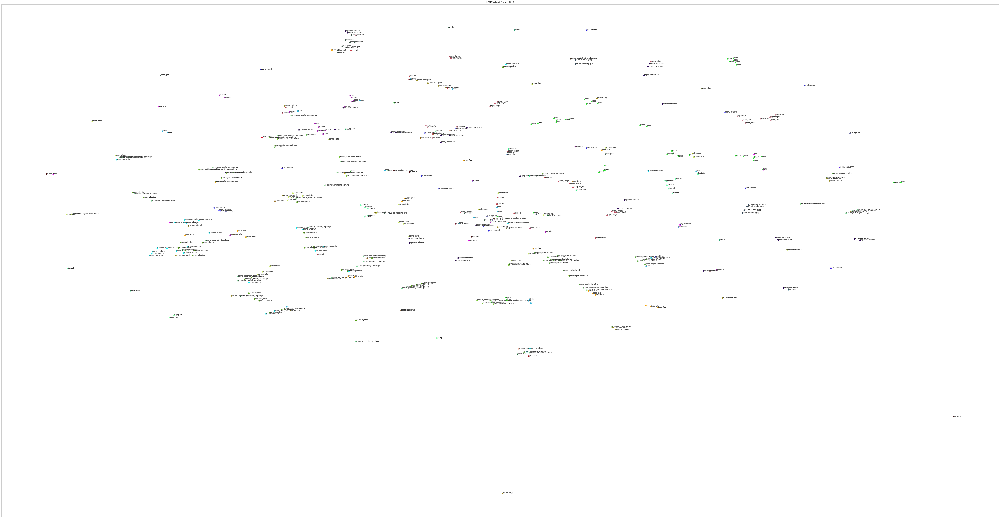

In [40]:
#Plot t-SNE with the labels

def plotwithLabel1():
    df = pd.DataFrame( index = tfModel2['hue'],columns=['x', 'y'])
    df['x'] = tfModel2['x'].values
    df['y'] = tfModel2['y'].values
    
    #Generates points and colour
    n_points =len(talk_Model2)
    #Generates points and colour
    #X, color = datasets.samples_generator.make_s_curve(n_points, random_state=572)
    
    #Now let's print out the t-SNE visualisation which incorporated tfidf and TruncatedSVD
    fig = plt.figure(figsize=(500,100))
    ax = fig.add_subplot(2, 5, 10)
    for word, pos in df.iterrows():
        ax.annotate(word, pos)
    plt.scatter(df['x'], df['y'], c=data, cmap=plt.cm.Spectral )
    plt.title("t-SNE (%.2g sec): " % (t1 - t0) + str(year_entered))
    ax.xaxis.set_major_formatter(NullFormatter())
    ax.yaxis.set_major_formatter(NullFormatter())
    ax.grid(False)
    return plt.show()

if talk_Model2.empty:
    print("No Topics available")
else:
    plotwithLabel1()

# [1.10] Plot the interactive TFIDF t-SNE model showing all series in colour

In [41]:
#Let's build the t-SNE interactive model

from bokeh.models import ColumnDataSource, OpenURL, TapTool
from bokeh.plotting import figure, show


plot_tsne = figure(plot_width=1000, plot_height=1000, tools=tools_tsne, title='talks')
plot_tsne.xgrid.visible = False
plot_tsne.ygrid.visible = False

source = ColumnDataSource(data=dict(
    x = tfModel2.x,
            y = tfModel2.y,
            colors = data,
            title = tfModel2['hue1'],
            series = tfModel2['hue'],
            time = tfModel2['time'],
            link = tfModel2['ref'],
            alpha = [0.9] * model2.shape[0],
            size = [7] * model2.shape[0]
    ))


hover_tsne = HoverTool(names=["df"], tooltips="""
    <div style="margin: 10">
        <div style="margin: 0 auto; width:300px;">
            <span style="font-size: 12px; font-weight: bold;">Title:</span>
            <span style="font-size: 12px">@title</span>
            <br>
            <span style="font-size: 12px; font-weight: bold;">Series:</span>
            <span style="font-size: 12px">@series</span>
             <br>
             <span style="font-size: 12px; font-weight: bold;">Time:</span>
            <span style="font-size: 12px">@time</span>
             <br>
             <span style="font-size: 12px; font-weight: bold;">Reference:</span>
            <span style="font-size: 12px">@link</span>
        </div>
    </div>
    """)

#p.circle('x', 'y', color='colors', size=7, source=source)
tools_tsne = [hover_tsne, 'pan', 'wheel_zoom', 'reset','tap']

plot_tsne.circle('x', 'y', size='size', fill_color='colors', 
                 alpha='alpha', line_alpha=0, line_width=0.01, source=source, name="df")

url = "https://samoa.dcs.gla.ac.uk/events/viewtalk.jsp?id=@link/"
taptool = plot_tsne.select(type=TapTool)
taptool.callback = OpenURL(url=url)

show(plot_tsne)

# [2] Topic Modelling and Latent Dirichlet Allocation (LDA) in Python and its t-SNE visualisation

In [42]:
#Now plots present the LDA visualisation 

#Let's use a new dataframe
talk_Model5 = talk_Model.copy(deep=True)
talk_Model5['clean_description_lda'] = talk_Model5['clean_description']
talk_Model5.head()

,title,description,starttime,speakerAffiliation,owningOu,name,shortname,day_value,clean_description,refID,hashedDescription,Description1,clean_description_lda
id,,,,,,,,,,,,,
2994,"Reliable, Secure and Scalable Software Systems...",http://www.dcs.gla.ac.uk/research/gpg/RS4/ The...,2017-09-01 00:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,363,,2994,ScottishInformaticsandComputerScienceAlliance(...,ScottishInformaticsandComputerScienceAlliance...,
2993,"Reliable, Secure and Scalable Software Systems...","<p class=""c7""><span class=""c3 c2"">The era of m...",2017-09-01 07:45:00,"ARM, Codeplay, EPCC, Maidsafe, Twitter, and Un...",5,Systems Section,socs-systems,362,The era of many-core computing is transforming...,2993,SystemsSection,The era of many-core computing is transforming...,The era of many-core computing is transforming...
3008,CAS Scotland Conference 2017,What to EXPECT The conference brings together ...,2017-09-02 00:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,362,What to EXPECT The conference brings together ...,3008,ScottishInformaticsandComputerScienceAlliance(...,What to EXPECT The conference brings together ...,What to EXPECT The conference brings together ...
2983,SICSA Education Workshop on Entrepreneurship.,SICSA is pleased to support the Education Work...,2017-09-05 09:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,358,SICSA is pleased to support the Education Work...,2983,ScottishInformaticsandComputerScienceAlliance(...,SICSA is pleased to support the Education Work...,SICSA is pleased to support the Education Work...
2995,"Silicon Valley Data Science ""Opportunities for...","<p>Join The Data Lab and John Akred, CTO of Si...",2017-09-07 08:30:00,The Data Lab,76,The Data Lab,datalab,356,"Join The Data Lab and John Akred, CTO of Silic...",2995,TheDataLab,"Join The Data Lab and John Akred, CTO of Silic...","Join The Data Lab and John Akred, CTO of Silic..."


In [43]:
# Removing numerals:
talk_Model5['clean_description_lda'] = talk_Model5['clean_description_lda'].map(lambda x: re.sub(r'\d+', '', x))


In [44]:
# Lower case:
talk_Model5['clean_description_lda'] = talk_Model5['clean_description_lda'].map(lambda x: x.lower())

In [45]:
print(talk_Model5['clean_description'][:5])

id
2994                                                     
2993    The era of many-core computing is transforming...
3008    What to EXPECT The conference brings together ...
2983    SICSA is pleased to support the Education Work...
2995    Join The Data Lab and John Akred, CTO of Silic...
Name: clean_description, dtype: object


In [46]:
#Tokenise each word in each talk abstract
talk_Model5['clean_description_lda']  = talk_Model5['clean_description_lda'] .map(lambda x: RegexpTokenizer(r'\w+').tokenize(x))
print(talk_Model5['clean_description_lda'].head())

id
2994                                                   []
2993    [the, era, of, many, core, computing, is, tran...
3008    [what, to, expect, the, conference, brings, to...
2983    [sicsa, is, pleased, to, support, the, educati...
2995    [join, the, data, lab, and, john, akred, cto, ...
Name: clean_description_lda, dtype: object


In [47]:
#Perform the stemming for the words
talk = SnowballStemmer("english")  
talk_Model5['clean_description_lda'] = talk_Model5['clean_description_lda'].map(lambda x: [talk.stem(token)for token in x])

In [48]:
#Remove the stop words
stop_en = stopwords.words('english')
talk_Model5['clean_description'] = talk_Model5['clean_description_lda'].map(lambda x: [t for t in x if t not in stop_en]) 
print(talk_Model5['clean_description'].head())

id
2994                                                   []
2993    [era, mani, core, comput, transform, much, com...
3008    [expect, confer, bring, togeth, divers, group,...
2983    [sicsa, pleas, support, educ, workshop, entrep...
2995    [join, data, lab, john, akr, cto, silicon, val...
Name: clean_description, dtype: object


In [49]:
#Keep only words of length greater then 1
talk_Model5['clean_description'] = talk_Model5['clean_description_lda'].map(lambda x: [t for t in x if len(t) > 1])
print(talk_Model5['clean_description'].head())

id
2994                                                   []
2993    [the, era, of, mani, core, comput, is, transfo...
3008    [what, to, expect, the, confer, bring, togeth,...
2983    [sicsa, is, pleas, to, support, the, educ, wor...
2995    [join, the, data, lab, and, john, akr, cto, of...
Name: clean_description, dtype: object


In [50]:
#Let's build the corpus and train the model
from gensim import corpora, models
np.random.seed(2017)
texts = talk_Model5['clean_description_lda'].values
dictionary = corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]
ldamodel = models.ldamodel.LdaModel(corpus, id2word=dictionary, 
                                    num_topics=8, passes=5, minimum_probability=0)

In [51]:
#Let the values of the corpus
hm = np.array([[y for (x,y) in ldamodel[corpus[i]]] for i in range(len(corpus))])

In [52]:
#Setup t-SNE, transform the LDA values, and insert the cordinates into a dataframe
tsne = TSNE(random_state=2017, perplexity=30)
tsne_embedding = tsne.fit_transform(hm)
tsne_embedding = pd.DataFrame(tsne_embedding, columns=['x','y'])
tsne_embedding['group'] = hm.argmax(axis=1)

In [53]:
#Build the t-SNE dataframe
tsne_embedding['hue'] = talk_Model['shortname'].values

tsne_embedding['hue1'] = talk_Model['title'].values

factor = pd.factorize(talk_Model['shortname'])

values_factor= pd.Series(factor[0][0:])

values_factor = DataFrame(values_factor)

tsne_embedding['hue_factor'] = values_factor.values

tsne_embedding.head()


,x,y,group,hue,hue1,hue_factor
0,-1.985005,-12.595729,0,sicsa,"Reliable, Secure and Scalable Software Systems...",0
1,-1.293682,24.003206,2,socs-systems,"Reliable, Secure and Scalable Software Systems...",1
2,-17.190617,-32.038559,4,sicsa,CAS Scotland Conference 2017,0
3,-14.199339,-31.921495,4,sicsa,SICSA Education Workshop on Entrepreneurship.,0
4,-13.645639,-31.449255,4,datalab,"Silicon Valley Data Science ""Opportunities for...",2


In [54]:
#Build the t-SNE datframe

tsne_embedding1 = pd.DataFrame(columns=['x','y'])

tsne_embedding1['x'] = tsne_embedding ['x'].values

tsne_embedding1['y'] = tsne_embedding ['y'].values

tsne_embedding1['hue'] = tsne_embedding['hue'].values

tsne_embedding1['title'] = tsne_embedding['hue1'].values

tsne_embedding1['hue1'] = tsne_embedding['hue_factor'].values

tsne_embedding1['time'] = talk_Model5['starttime'].values

tsne_embedding1['group'] =  tsne_embedding['group'].values

tsne_embedding1['ref'] = talk_Model5['refID'].values

tsne_embedding1.set_index('hue')

tsne_embedding1.head()

,x,y,hue,title,hue1,time,group,ref
0,-1.985005,-12.595729,sicsa,"Reliable, Secure and Scalable Software Systems...",0,2017-09-01 00:00:00,0,2994
1,-1.293682,24.003206,socs-systems,"Reliable, Secure and Scalable Software Systems...",1,2017-09-01 07:45:00,2,2993
2,-17.190617,-32.038559,sicsa,CAS Scotland Conference 2017,0,2017-09-02 00:00:00,4,3008
3,-14.199339,-31.921495,sicsa,SICSA Education Workshop on Entrepreneurship.,0,2017-09-05 09:00:00,4,2983
4,-13.645639,-31.449255,datalab,"Silicon Valley Data Science ""Opportunities for...",2,2017-09-07 08:30:00,4,2995


In [55]:
#Set the t-SNE dataframe in ascending order of hue1 (i.e. the factorisation of the shortname column)
tsne_embedding1 = tsne_embedding1.sort_values('hue1',ascending=True)

tsne_embedding1.head()

,x,y,hue,title,hue1,time,group,ref
0,-1.985005,-12.595729,sicsa,"Reliable, Secure and Scalable Software Systems...",0,2017-09-01 00:00:00,0,2994
369,0.529591,30.993298,sicsa,Data-driven Modelling and Analysis of Complex ...,0,2018-03-19 10:00:00,2,8822
40,-1.985943,-12.596374,sicsa,SICSA DemoFest 2017,0,2017-10-03 15:00:00,0,2738
42,15.591513,-7.526347,sicsa,SICSA DemoFest 2017: Bringing Research to Life,0,2017-10-03 15:00:00,1,8286
343,-0.101180,7.454471,sicsa,Scottish Programming Languages Seminar (SPLS),0,2018-03-07 13:00:00,2,8419


In [56]:
#View the dataframe
tsne_embedding1.head()

,x,y,hue,title,hue1,time,group,ref
0,-1.985005,-12.595729,sicsa,"Reliable, Secure and Scalable Software Systems...",0,2017-09-01 00:00:00,0,2994
369,0.529591,30.993298,sicsa,Data-driven Modelling and Analysis of Complex ...,0,2018-03-19 10:00:00,2,8822
40,-1.985943,-12.596374,sicsa,SICSA DemoFest 2017,0,2017-10-03 15:00:00,0,2738
42,15.591513,-7.526347,sicsa,SICSA DemoFest 2017: Bringing Research to Life,0,2017-10-03 15:00:00,1,8286
343,-0.101180,7.454471,sicsa,Scottish Programming Languages Seminar (SPLS),0,2018-03-07 13:00:00,2,8419


# 2.1 Plot the LDA t-SNE model with the shortname

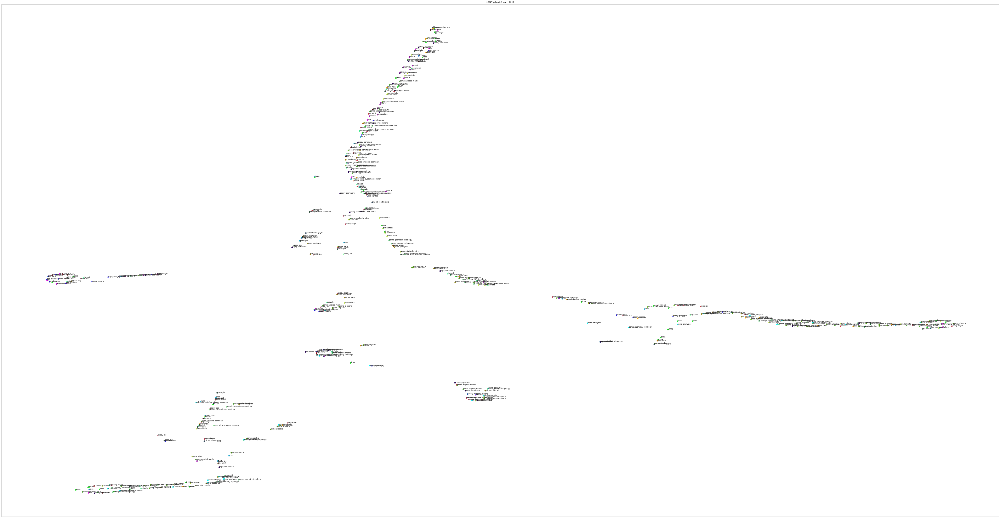

In [57]:
#Plot the t-SNE model with the shortname
def plotwithLabel():
    df = pd.DataFrame( index = tsne_embedding1['hue'],columns=['x', 'y'])
    df['x'] = tsne_embedding1['x'].values
    df['y'] = tsne_embedding1['y'].values
    
    #Generates points and colour
    n_points =len(talk_Model)
    #Generates points and colour
    #X, color = datasets.samples_generator.make_s_curve(n_points, random_state=572)
    
    #Now let's print out the t-SNE visualisation
    fig = plt.figure(figsize=(500,100))
    ax = fig.add_subplot(2, 5, 10)
    for word, pos in df.iterrows():
        ax.annotate(word, pos)
    plt.scatter(df['x'], df['y'], c= data, cmap=plt.cm.Spectral )
    plt.title("t-SNE (%.2g sec): " % (t1 - t0) + str(year_entered))
    ax.xaxis.set_major_formatter(NullFormatter())
    ax.yaxis.set_major_formatter(NullFormatter())
    ax.grid(False)
    
    talk_Model5['x'] = tsne_embedding1['x']
    talk_Model5['y'] = tsne_embedding1['y']
    

    return plt.show()

plotwithLabel()

# 2.2 Plot the LDA-t-SNE model with the title

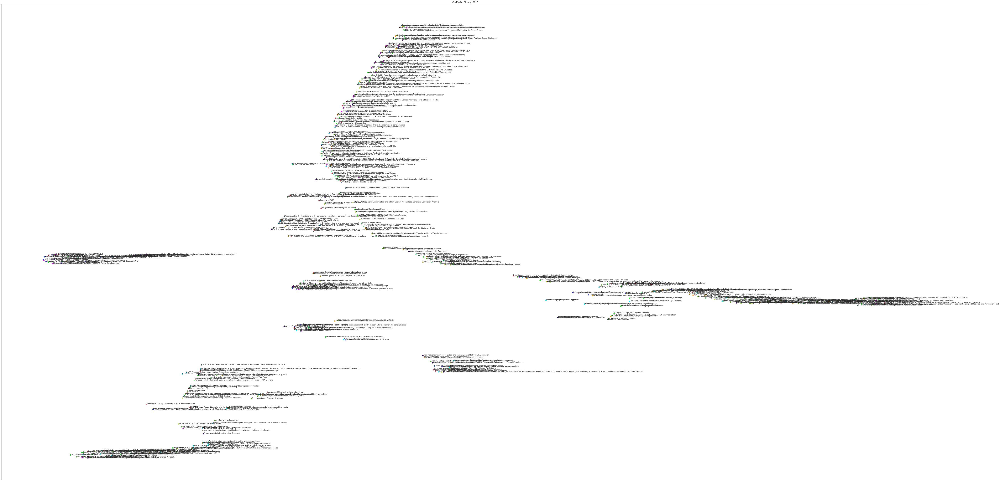

In [58]:
#Plot the t-SNE model with the title
def plotwithLabel():
    df = pd.DataFrame( index = tsne_embedding1['title'],columns=['x', 'y'])
    df['x'] = tsne_embedding1['x'].values
    df['y'] = tsne_embedding1['y'].values
    
    #Generates points and colour
    n_points =len(talk_Model)
    #Generates points and colour
    X, color = datasets.samples_generator.make_s_curve(n_points, random_state=572)
    
    #Now let's print out the t-SNE visualisation
    fig = plt.figure(figsize=(500,100))
    ax = fig.add_subplot(2, 5, 10)
    for word, pos in df.iterrows():
        ax.annotate(word, pos)
    plt.scatter(df['x'], df['y'], c=data, cmap=plt.cm.Spectral )
    plt.title("t-SNE (%.2g sec): " % (t1 - t0) + str(year_entered))
    ax.xaxis.set_major_formatter(NullFormatter())
    ax.yaxis.set_major_formatter(NullFormatter())
    ax.grid(False)
    
    talk_Model5['x'] = tsne_embedding1['x']
    talk_Model5['y'] = tsne_embedding1['y']
    
    #Save to model to JSON file
    talk_Model5.to_json('LDA-tSNE'+str(year_entered)+'.json')
    return plt.show()

plotwithLabel()

# 2.3 Plot the interactive LDA t-SNE model showing all series in colour

In [59]:
#Plot the interactive LDA t-SNE model
from bokeh.models import ColumnDataSource, OpenURL, TapTool
from bokeh.plotting import figure, show


source = ColumnDataSource(data=dict(
    x = tsne_embedding1.x,
            y = tsne_embedding1.y,
            colors = data,
            title = tsne_embedding1['title'],
            series = tsne_embedding1['hue'],
            time = tsne_embedding1['time'],
            link = tsne_embedding1['ref'],
            alpha = [0.9] * tsne_embedding.shape[0],
            size = [7] * tsne_embedding.shape[0]
    ))


hover_tsne = HoverTool(names=["df"], tooltips="""
    <div style="margin: 10">
        <div style="margin: 0 auto; width:300px;">
            <span style="font-size: 12px; font-weight: bold;">Title:</span>
            <span style="font-size: 12px">@title</span>
            <br>
            <span style="font-size: 12px; font-weight: bold;">Series:</span>
            <span style="font-size: 12px">@series</span>
             <br>
             <span style="font-size: 12px; font-weight: bold;">Time:</span>
            <span style="font-size: 12px">@time</span>
             <br>
             <span style="font-size: 12px; font-weight: bold;">Reference:</span>
            <span style="font-size: 12px">@link</span>
        </div>
    </div>
    """)


#p.circle('x', 'y', color='colors', size=7, source=source)
tools_tsne = [hover_tsne, 'pan', 'wheel_zoom', 'reset','tap']

plot_tsne = figure(plot_width=1000, plot_height=1000, tools=tools_tsne, title='talks')
plot_tsne.xgrid.visible = False
plot_tsne.ygrid.visible = False

plot_tsne.circle('x', 'y', size='size', fill_color='colors', 
                 alpha='alpha', line_alpha=0, line_width=0.01, source=source, name="df")

url = "https://samoa.dcs.gla.ac.uk/events/viewtalk.jsp?id=@link/"
taptool = plot_tsne.select(type=TapTool)
taptool.callback = OpenURL(url=url)

show(plot_tsne)

# 2.4 Plot showing the different LDA aggregated talks into groups in colour

In [60]:
from bokeh.models import ColumnDataSource, OpenURL, TapTool
from bokeh.plotting import figure, show


source = ColumnDataSource(data=dict(
    x = tsne_embedding1.x,
            y = tsne_embedding1.y,
            colors = [all_palettes['Set1'][8][i] for i in tsne_embedding1.group],
            title = tsne_embedding1['title'],
            series = tsne_embedding1['hue'],
            time = tsne_embedding1['time'],
            link = tsne_embedding1['ref'],
            alpha = [0.9] * tsne_embedding.shape[0],
            size = [7] * tsne_embedding.shape[0]
    ))


hover_tsne = HoverTool(names=["df"], tooltips="""
    <div style="margin: 10">
        <div style="margin: 0 auto; width:300px;">
            <span style="font-size: 12px; font-weight: bold;">Title:</span>
            <span style="font-size: 12px">@title</span>
            <br>
            <span style="font-size: 12px; font-weight: bold;">Series:</span>
            <span style="font-size: 12px">@series</span>
             <br>
             <span style="font-size: 12px; font-weight: bold;">Time:</span>
            <span style="font-size: 12px">@time</span>
             <br>
             <span style="font-size: 12px; font-weight: bold;">Reference:</span>
            <span style="font-size: 12px">@link</span>
        </div>
    </div>
    """)

#p.circle('x', 'y', color='colors', size=7, source=source)
tools_tsne = [hover_tsne, 'pan', 'wheel_zoom', 'reset','tap']


plot_tsne = figure(plot_width=1000, plot_height=1000, tools=tools_tsne, title='talks')
plot_tsne.xgrid.visible = False
plot_tsne.ygrid.visible = False

plot_tsne.circle('x', 'y', size='size', fill_color='colors', 
                 alpha='alpha', line_alpha=0, line_width=0.01, source=source, name="df")

url = "https://samoa.dcs.gla.ac.uk/events/viewtalk.jsp?id=@link/"
taptool = plot_tsne.select(type=TapTool)
taptool.callback = OpenURL(url=url)

show(plot_tsne)

# 2.5 LDA t-SNE Visualisation with hash injection method showing series

In [61]:
#Set the dataframe
talk_Model6 = talk_Model.copy(deep=True)

talk_Model6['clean_description_ldaHash'] = talk_Model6['Description1']

talk_Model6.head()

,title,description,starttime,speakerAffiliation,owningOu,name,shortname,day_value,clean_description,refID,hashedDescription,Description1,clean_description_ldaHash
id,,,,,,,,,,,,,
2994,"Reliable, Secure and Scalable Software Systems...",http://www.dcs.gla.ac.uk/research/gpg/RS4/ The...,2017-09-01 00:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,363,,2994,ScottishInformaticsandComputerScienceAlliance(...,ScottishInformaticsandComputerScienceAlliance...,ScottishInformaticsandComputerScienceAlliance...
2993,"Reliable, Secure and Scalable Software Systems...","<p class=""c7""><span class=""c3 c2"">The era of m...",2017-09-01 07:45:00,"ARM, Codeplay, EPCC, Maidsafe, Twitter, and Un...",5,Systems Section,socs-systems,362,The era of many-core computing is transforming...,2993,SystemsSection,The era of many-core computing is transforming...,The era of many-core computing is transforming...
3008,CAS Scotland Conference 2017,What to EXPECT The conference brings together ...,2017-09-02 00:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,362,What to EXPECT The conference brings together ...,3008,ScottishInformaticsandComputerScienceAlliance(...,What to EXPECT The conference brings together ...,What to EXPECT The conference brings together ...
2983,SICSA Education Workshop on Entrepreneurship.,SICSA is pleased to support the Education Work...,2017-09-05 09:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,358,SICSA is pleased to support the Education Work...,2983,ScottishInformaticsandComputerScienceAlliance(...,SICSA is pleased to support the Education Work...,SICSA is pleased to support the Education Work...
2995,"Silicon Valley Data Science ""Opportunities for...","<p>Join The Data Lab and John Akred, CTO of Si...",2017-09-07 08:30:00,The Data Lab,76,The Data Lab,datalab,356,"Join The Data Lab and John Akred, CTO of Silic...",2995,TheDataLab,"Join The Data Lab and John Akred, CTO of Silic...","Join The Data Lab and John Akred, CTO of Silic..."


In [62]:
# Removing numerals:
talk_Model6['clean_description_lda'] = talk_Model6['clean_description_ldaHash'].map(lambda x: re.sub(r'\d+', '', x))


In [63]:
# Lower case:
talk_Model6['clean_description_ldaHash'] = talk_Model6['clean_description_ldaHash'].map(lambda x: x.lower())

In [64]:
talk_Model6['clean_description_ldaHash']  = talk_Model6['clean_description_ldaHash'] .map(lambda x: RegexpTokenizer(r'\w+').tokenize(x))
print(talk_Model6['clean_description_ldaHash'].head())

id
2994    [scottishinformaticsandcomputersciencealliance...
2993    [the, era, of, many, core, computing, is, tran...
3008    [what, to, expect, the, conference, brings, to...
2983    [sicsa, is, pleased, to, support, the, educati...
2995    [join, the, data, lab, and, john, akred, cto, ...
Name: clean_description_ldaHash, dtype: object


In [65]:
#Stem the words
talk = SnowballStemmer("english")  
talk_Model6['clean_description_ldaHash'] = talk_Model6['clean_description_ldaHash'].map(lambda x: [talk.stem(token)for token in x])

In [66]:
#Remove all stop words
stop_en = stopwords.words('english')
talk_Model6['clean_description_ldaHash'] = talk_Model6['clean_description_ldaHash'].map(lambda x: [t for t in x if t not in stop_en]) 
print(talk_Model6['clean_description_ldaHash'].head())

id
2994    [scottishinformaticsandcomputersciencealli, si...
2993    [era, mani, core, comput, transform, much, com...
3008    [expect, confer, bring, togeth, divers, group,...
2983    [sicsa, pleas, support, educ, workshop, entrep...
2995    [join, data, lab, john, akr, cto, silicon, val...
Name: clean_description_ldaHash, dtype: object


In [67]:
talk_Model6['clean_description_ldaHash'] = talk_Model6['clean_description_ldaHash'].map(lambda x: [t for t in x if len(t) > 1])

In [68]:
#Build the vocabulary
from gensim import corpora, models
np.random.seed(2017)
texts = talk_Model6['clean_description_ldaHash'].values
dictionary = corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]
ldamodel = models.ldamodel.LdaModel(corpus, id2word=dictionary, 
                                    num_topics=8, passes=5, minimum_probability=0)

In [69]:
#Get the values of the corpus
hm = np.array([[y for (x,y) in ldamodel[corpus[i]]] for i in range(len(corpus))])

In [70]:
#Build the t-SNE model and insert the coordinates to the datframe
tsne = TSNE(random_state=2017, perplexity=30)
tsne_embedding = tsne.fit_transform(hm)
tsne_embedding = pd.DataFrame(tsne_embedding, columns=['x','y'])
tsne_embedding['group'] = hm.argmax(axis=1)

In [71]:
#Build the tsne dataframe
tsne_embedding['hue'] = talk_Model['shortname'].values

tsne_embedding['hue1'] = talk_Model['title'].values

factor = pd.factorize(talk_Model['shortname'])

values_factor= pd.Series(factor[0][0:])

values_factor = DataFrame(values_factor)

tsne_embedding['hue_factor'] = values_factor.values



In [72]:
#Build the data Frame
tsne_embedding1 = pd.DataFrame(columns=['x','y'])

tsne_embedding1['x'] = tsne_embedding ['x'].values

tsne_embedding1['y'] = tsne_embedding ['y'].values

tsne_embedding1['hue'] = tsne_embedding['hue'].values

tsne_embedding1['title'] = tsne_embedding['hue1'].values

tsne_embedding1['hue1'] = tsne_embedding['hue_factor'].values

tsne_embedding1['time'] = talk_Model6['starttime'].values

tsne_embedding1['group'] = tsne_embedding['group'].values

tsne_embedding1['ref'] = talk_Model6['refID'].values

tsne_embedding1.set_index('hue')

tsne_embedding1.head()

,x,y,hue,title,hue1,time,group,ref
0,-18.259609,9.579597,sicsa,"Reliable, Secure and Scalable Software Systems...",0,2017-09-01 00:00:00,1,2994
1,4.785285,-30.681309,socs-systems,"Reliable, Secure and Scalable Software Systems...",1,2017-09-01 07:45:00,6,2993
2,-22.752264,15.602629,sicsa,CAS Scotland Conference 2017,0,2017-09-02 00:00:00,1,3008
3,-24.357380,13.509602,sicsa,SICSA Education Workshop on Entrepreneurship.,0,2017-09-05 09:00:00,1,2983
4,-20.890650,6.967495,datalab,"Silicon Valley Data Science ""Opportunities for...",2,2017-09-07 08:30:00,1,2995


In [73]:
#Set t-SNE datframe in ascending order in other to attribute colours properly
tsne_embedding1 = tsne_embedding1.sort_values('hue1',ascending=True)

tsne_embedding1.head()

,x,y,hue,title,hue1,time,group,ref
0,-18.259609,9.579597,sicsa,"Reliable, Secure and Scalable Software Systems...",0,2017-09-01 00:00:00,1,2994
369,3.603836,-23.040800,sicsa,Data-driven Modelling and Analysis of Complex ...,0,2018-03-19 10:00:00,6,8822
40,-18.259611,9.579705,sicsa,SICSA DemoFest 2017,0,2017-10-03 15:00:00,1,2738
42,-20.053268,11.845067,sicsa,SICSA DemoFest 2017: Bringing Research to Life,0,2017-10-03 15:00:00,1,8286
343,-28.088909,-12.760924,sicsa,Scottish Programming Languages Seminar (SPLS),0,2018-03-07 13:00:00,7,8419


# 4.6 Plot the LDA t-SNE -Hash model with shortname

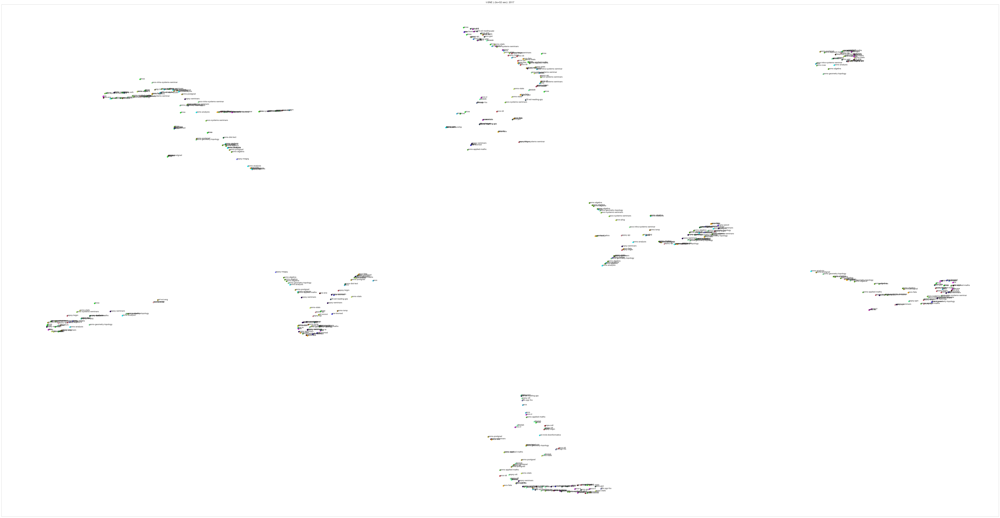

In [74]:
#Plot the LDA t-SNE model with shortname
def plotwithLabel():
    df = pd.DataFrame( index = tsne_embedding1['hue'],columns=['x', 'y'])
    df['x'] = tsne_embedding1['x'].values
    df['y'] = tsne_embedding1['y'].values
    
    #Generates points and colour
    n_points =len(talk_Model)
    #Generates points and colour
    #X, color = datasets.samples_generator.make_s_curve(n_points, random_state=572)
    
    #Now let's print out the t-SNE visualisation which incorporated tfidf and TruncatedSVD
    fig = plt.figure(figsize=(500,100))
    ax = fig.add_subplot(2, 5, 10)
    for word, pos in df.iterrows():
        ax.annotate(word, pos)
    plt.scatter(df['x'], df['y'], c= data, cmap=plt.cm.Spectral )
    plt.title("t-SNE (%.2g sec): " % (t1 - t0) + str(year_entered))
    ax.xaxis.set_major_formatter(NullFormatter())
    ax.yaxis.set_major_formatter(NullFormatter())
    ax.grid(False)
    
    talk_Model6['x'] = tsne_embedding1['x']
    talk_Model6['y'] = tsne_embedding1['y']
    
    return plt.show()

plotwithLabel()

# 4.7  Plot the LDA t-SNE -Hash model with title

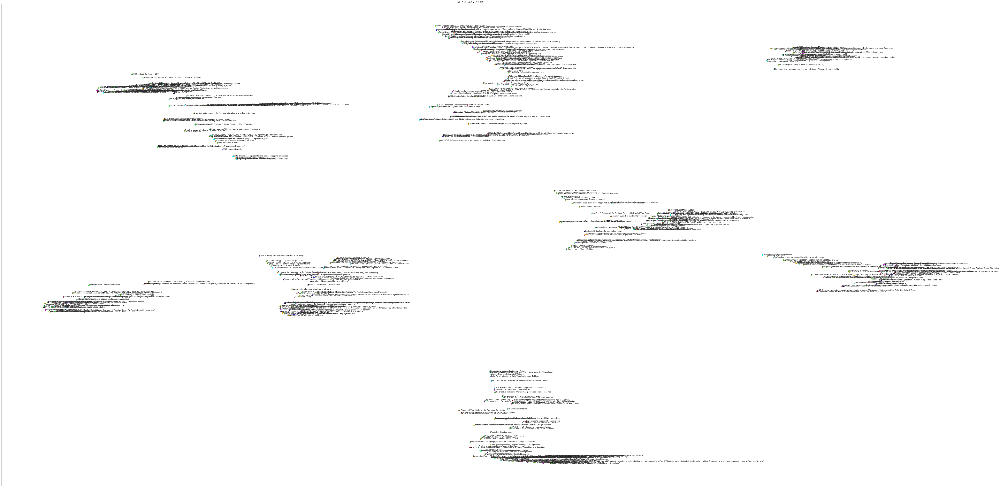

In [75]:
#Plot the LDA t-SNE model with title
def plotwithLabel():
    df = pd.DataFrame( index = tsne_embedding1['title'],columns=['x', 'y'])
    df['x'] = tsne_embedding1['x'].values
    df['y'] = tsne_embedding1['y'].values
    
    #Generates points and colour
    n_points =len(talk_Model)
    #Generates points and colour
    X, color = datasets.samples_generator.make_s_curve(n_points, random_state=572)
    
    #Now let's print out the t-SNE visualisation which incorporated tfidf and TruncatedSVD
    fig = plt.figure(figsize=(500,100))
    ax = fig.add_subplot(2, 5, 10)
    for word, pos in df.iterrows():
        ax.annotate(word, pos)
    plt.scatter(df['x'], df['y'], c=data, cmap=plt.cm.Spectral )
    plt.title("t-SNE (%.2g sec): " % (t1 - t0) + str(year_entered))
    ax.xaxis.set_major_formatter(NullFormatter())
    ax.yaxis.set_major_formatter(NullFormatter())
    ax.grid(False)
    
    talk_Model6['x'] = tsne_embedding1['x']
    talk_Model6['y'] = tsne_embedding1['y']
    
    #Save to model to JSON file
    talk_Model6.to_json('LDA-tSNE-Hash'+str(year_entered)+'.json')
    return plt.show()

plotwithLabel()

# 4.8 Plot the interactive LDA t-SNE (Hash) model showing series

In [76]:
#
from bokeh.models import ColumnDataSource, OpenURL, TapTool
from bokeh.plotting import figure, show


plot_tsne = figure(plot_width=1000, plot_height=1000, tools=tools_tsne, title='talks')
plot_tsne.xgrid.visible = False
plot_tsne.ygrid.visible = False

source = ColumnDataSource(data=dict(
    x = tsne_embedding1.x,
            y = tsne_embedding1.y,
            colors = data,
            title = tsne_embedding1['title'],
            series = tsne_embedding1['hue'],
            time = tsne_embedding1['time'],
            link = tsne_embedding1['ref'],
            alpha = [0.9] * tsne_embedding.shape[0],
            size = [7] * tsne_embedding.shape[0]
    ))


hover_tsne = HoverTool(names=["df"], tooltips="""
    <div style="margin: 10">
        <div style="margin: 0 auto; width:300px;">
            <span style="font-size: 12px; font-weight: bold;">Title:</span>
            <span style="font-size: 12px">@title</span>
            <br>
            <span style="font-size: 12px; font-weight: bold;">Series:</span>
            <span style="font-size: 12px">@series</span>
             <br>
             <span style="font-size: 12px; font-weight: bold;">Time:</span>
            <span style="font-size: 12px">@time</span>
             <br>
             <span style="font-size: 12px; font-weight: bold;">Reference:</span>
            <span style="font-size: 12px">@link</span>
        </div>
    </div>
    """)

#p.circle('x', 'y', color='colors', size=7, source=source)
tools_tsne = [hover_tsne, 'pan', 'wheel_zoom', 'reset','tap']

plot_tsne.circle('x', 'y', size='size', fill_color='colors', 
                 alpha='alpha', line_alpha=0, line_width=0.01, source=source, name="df")

url = "https://samoa.dcs.gla.ac.uk/events/viewtalk.jsp?id=@link/"
taptool = plot_tsne.select(type=TapTool)
taptool.callback = OpenURL(url=url)

show(plot_tsne)

# 4.9 Plot the interactive LDA t-SNE model showing LDA argmax

In [77]:
from bokeh.models import ColumnDataSource, OpenURL, TapTool
from bokeh.plotting import figure, show


source = ColumnDataSource(data=dict(
    x = tsne_embedding1.x,
            y = tsne_embedding1.y,
            colors = [all_palettes['Set1'][8][i] for i in tsne_embedding1.group],
            title = tsne_embedding1['title'],
            series = tsne_embedding1['hue'],
            time = tsne_embedding1['time'],
            link = tsne_embedding1['ref'],
            alpha = [0.9] * tsne_embedding.shape[0],
            size = [7] * tsne_embedding.shape[0]
    ))


hover_tsne = HoverTool(names=["df"], tooltips="""
    <div style="margin: 10">
        <div style="margin: 0 auto; width:300px;">
            <span style="font-size: 12px; font-weight: bold;">Title:</span>
            <span style="font-size: 12px">@title</span>
            <br>
            <span style="font-size: 12px; font-weight: bold;">Series:</span>
            <span style="font-size: 12px">@series</span>
             <br>
             <span style="font-size: 12px; font-weight: bold;">Time:</span>
            <span style="font-size: 12px">@time</span>
             <br>
             <span style="font-size: 12px; font-weight: bold;">Reference:</span>
            <span style="font-size: 12px">@link</span>
        </div>
    </div>
    """)

#p.circle('x', 'y', color='colors', size=7, source=source)
tools_tsne = [hover_tsne, 'pan', 'wheel_zoom', 'reset','tap']


plot_tsne = figure(plot_width=1000, plot_height=1000, tools=tools_tsne, title='talks')
plot_tsne.xgrid.visible = False
plot_tsne.ygrid.visible = False

plot_tsne.circle('x', 'y', size='size', fill_color='colors', 
                 alpha='alpha', line_alpha=0, line_width=0.01, source=source, name="df")

url = "https://samoa.dcs.gla.ac.uk/events/viewtalk.jsp?id=@link/"
taptool = plot_tsne.select(type=TapTool)
taptool.callback = OpenURL(url=url)

show(plot_tsne)

# [3] Topic Modelling and Latent Dirichlet Allocation (LDA) in Python with Gensim (For topic search)

In [78]:
#Get the abstract content
dframe =DataFrame(talk_Model['clean_description'])

In [79]:
#Display the content
dframe.head(7)

,clean_description
id,
2994,
2993,The era of many-core computing is transforming...
3008,What to EXPECT The conference brings together ...
2983,SICSA is pleased to support the Education Work...
2995,"Join The Data Lab and John Akred, CTO of Silic..."
2998,"Join The Data Lab and John Akred, CTO of Silic..."
3006,Do you have any burning questions about academ...


In [80]:
#Add the indexex to the dataframe
data_text = dframe[['clean_description']]
data_text['index'] = data_text.index

In [81]:
#Set name atritube as document
documents = data_text

In [82]:
#Print the dataframe
print(len(documents))
print(documents[:5])

548
                                      clean_description  index
id                                                            
2994                                                      2994
2993  The era of many-core computing is transforming...   2993
3008  What to EXPECT The conference brings together ...   3008
2983  SICSA is pleased to support the Education Work...   2983
2995  Join The Data Lab and John Akred, CTO of Silic...   2995


In [83]:
#Add the relevant natural language processing libraries
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.stem.porter import *
from nltk import PorterStemmer
import numpy as np
np.random.seed(2018)
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [84]:
#Now let's write methods to lammatise and stem the words
def lemmatize_stemming(text):
    return PorterStemmer().stem(WordNetLemmatizer().lemmatize(text, pos='v'))
def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3:
            result.append(lemmatize_stemming(token))
    return result

In [85]:
#Now process the words
processed_docs = documents['clean_description'].map(preprocess)
processed_docs[:10]

id
2994                                                   []
2993    [core, comput, transform, comput, area, like, ...
3008    [expect, confer, bring, divers, group, educ, i...
2983    [sicsa, pleas, support, educ, workshop, take, ...
2995    [join, data, john, akr, silicon, valley, data,...
2998    [join, data, john, akr, silicon, valley, data,...
3006    [burn, question, academia, like, meet, ecr, co...
8266    [workshop, rhythm, brain, worb, hold, glasgow,...
8269    [inform, talk, discuss, theatr, drama, autism,...
8283    [histor, develop, tool, strongli, link, human,...
Name: clean_description, dtype: object

In [86]:
#For a bag of words
dictionary = gensim.corpora.Dictionary(processed_docs)
count = 0
for k, v in dictionary.iteritems():
    count += 1 
    
str(count) + ' words in the dictionary'

'6129 words in the dictionary'

In [87]:
#Keep all tokens
#Hence sent no_below to zero and no_above to maximum (1)
dictionary.filter_extremes(no_below=0, no_above=1, keep_n=100000)

In [88]:
#For each document create number of words and how many times it appears
bow_corpus = [dictionary.doc2bow(doc) for doc in processed_docs]
#bow_corpus[100].

In [89]:
#Review the bags of words for each preprocessed document
bow_doc_2993 = bow_corpus[200]
for i in range(len(bow_doc_2993)):
    print("Word {} (\"{}\") appears {} time.".format(bow_doc_2993[i][0], 
                                               dictionary[bow_doc_2993[i][0]], 
bow_doc_2993[i][1]))

Word 4 ("area") appears 1 time.
Word 112 ("current") appears 1 time.
Word 132 ("especi") appears 1 time.
Word 146 ("focu") appears 1 time.
Word 148 ("format") appears 1 time.
Word 178 ("introduc") appears 1 time.
Word 287 ("work") appears 2 time.
Word 312 ("multi") appears 1 time.
Word 315 ("present") appears 1 time.
Word 333 ("advantag") appears 1 time.
Word 385 ("case") appears 1 time.
Word 530 ("certain") appears 1 time.
Word 532 ("constraint") appears 1 time.
Word 575 ("hybrid") appears 1 time.
Word 592 ("observ") appears 1 time.
Word 634 ("uniqu") appears 1 time.
Word 683 ("allow") appears 1 time.
Word 704 ("period") appears 2 time.
Word 771 ("mainli") appears 1 time.
Word 801 ("larg") appears 1 time.
Word 810 ("popul") appears 1 time.
Word 812 ("rsquo") appears 2 time.
Word 832 ("congest") appears 1 time.
Word 906 ("equal") appears 1 time.
Word 918 ("point") appears 1 time.
Word 1039 ("singl") appears 1 time.
Word 1193 ("earth") appears 3 time.
Word 1381 ("orbit") appears 3 time.

In [90]:
#Let's create a tfidf model and also transform it
from gensim import corpora, models
tfidf = models.TfidfModel(bow_corpus)
print(tfidf)
corpus_tfidf = tfidf[bow_corpus]


TfidfModel(num_docs=548, num_nnz=35259)


In [91]:
#print the tfidf valves for each word
#for doc in corpus_tfidf:
      #for index, value in doc:
        #print (index,value)

In [92]:
#Let's train the LDA model
lda_model = gensim.models.LdaMulticore(bow_corpus, num_topics=10, id2word=dictionary, passes=2, workers=2)

In [93]:
#Let's check the weight of words in each topic
for idx, topic in lda_model.print_topics(1):
    print('Topic: {} \nWords: {}'.format(idx, topic))

Topic: 2 
Words: 0.012*"model" + 0.008*"differ" + 0.007*"work" + 0.007*"present" + 0.007*"problem" + 0.005*"research" + 0.005*"group" + 0.005*"talk" + 0.005*"univers" + 0.004*"natur"


In [94]:
#Let us seperate words in each topic by using words in the topic
#We will run LDA using tfidf
lda_model_tfidf = gensim.models.LdaMulticore(corpus_tfidf, num_topics=10, id2word=dictionary, passes=2, workers=4)
for idx, topic in lda_model_tfidf.print_topics(-1):
    print('Topic: {} Word: {}'.format(idx, topic))

Topic: 0 Word: 0.002*"group" + 0.001*"model" + 0.001*"question" + 0.001*"studi" + 0.001*"mathemat" + 0.001*"peatland" + 0.001*"cardiac" + 0.001*"answer" + 0.001*"data" + 0.001*"research"
Topic: 1 Word: 0.002*"time" + 0.002*"quantum" + 0.001*"algebra" + 0.001*"algorithm" + 0.001*"imag" + 0.001*"graph" + 0.001*"scan" + 0.001*"manufactur" + 0.001*"real" + 0.001*"statist"
Topic: 2 Word: 0.004*"data" + 0.002*"research" + 0.002*"group" + 0.002*"model" + 0.001*"scienc" + 0.001*"system" + 0.001*"univers" + 0.001*"process" + 0.001*"interact" + 0.001*"analyt"
Topic: 3 Word: 0.002*"network" + 0.001*"algebra" + 0.001*"data" + 0.001*"neural" + 0.001*"schizophrenia" + 0.001*"dynam" + 0.001*"robot" + 0.001*"group" + 0.001*"task" + 0.001*"process"
Topic: 4 Word: 0.005*"announc" + 0.002*"soon" + 0.001*"model" + 0.001*"languag" + 0.001*"data" + 0.001*"sneak" + 0.001*"bodi" + 0.001*"graphen" + 0.001*"peak" + 0.001*"patient"
Topic: 5 Word: 0.003*"algebra" + 0.001*"hopf" + 0.001*"model" + 0.001*"learn" + 0

In [95]:
#Let us seperate words in each topic by using words in the topic
#We will run LDA using bag of words
for index, score in sorted(lda_model[bow_corpus[300]], key=lambda tup: -1*tup[1]):
    print("\nScore: {}\t \nTopic: {}".format(score, lda_model.print_topic(index, 10)))


Score: 0.9876689314842224	 
Topic: 0.012*"data" + 0.010*"univers" + 0.009*"model" + 0.009*"research" + 0.009*"talk" + 0.008*"algebra" + 0.008*"rsquo" + 0.007*"work" + 0.007*"comput" + 0.006*"group"


In [96]:
#Performance evaluation
#The test document has a high probability to be part of the topic
#that the model assigned
for index, score in sorted(lda_model_tfidf[bow_corpus[300]], key=lambda tup: -1*tup[1]):
    print("\nScore: {}\t \nTopic: {}".format(score, lda_model_tfidf.print_topic(index, 10)))


Score: 0.6631036400794983	 
Topic: 0.002*"network" + 0.001*"algebra" + 0.001*"data" + 0.001*"neural" + 0.001*"schizophrenia" + 0.001*"dynam" + 0.001*"robot" + 0.001*"group" + 0.001*"task" + 0.001*"process"

Score: 0.21427804231643677	 
Topic: 0.004*"data" + 0.002*"research" + 0.002*"group" + 0.002*"model" + 0.001*"scienc" + 0.001*"system" + 0.001*"univers" + 0.001*"process" + 0.001*"interact" + 0.001*"analyt"

Score: 0.11302755773067474	 
Topic: 0.002*"model" + 0.002*"data" + 0.002*"univers" + 0.002*"research" + 0.002*"comput" + 0.002*"leav" + 0.002*"memori" + 0.001*"surfac" + 0.001*"rsquo" + 0.001*"refil"


In [97]:
#View talk titles in rows
try:
    talk_Model.iloc[1]['title']
    talk_Model.iloc[2]['title']
except:
    print("Row not available")

In [98]:
#Now do word check
#Method to search for words 
def search_words():
    process = True
    while process:
        try:
            searched_word = input("Please enter the word you wish to search: ")
            return searched_word
        except:
            print ("!!Invalid input data, please enter the right data")

#Enter word now
searched_word = search_words()


Please enter the word you wish to search: talk


In [99]:
#Now let's text new documents
unseen_document = searched_word
bow_vector = dictionary.doc2bow(preprocess(unseen_document))
for index, score in sorted(lda_model[bow_vector], key=lambda tup: -1*tup[1]):
    print("Score: {}\t Topic: {}\t{} \n\n".format(score, talk_Model.iloc[index]['title'], lda_model.print_topic(index, 4)))

Score: 0.5498693585395813	 Topic: WoRB  Workshop on Rhythms in the Brain	0.009*"talk" + 0.007*"research" + 0.006*"user" + 0.006*"perform" 


Score: 0.05002640187740326	 Topic: SICSA Education Workshop on Entrepreneurship.	0.012*"data" + 0.010*"univers" + 0.009*"model" + 0.009*"research" 


Score: 0.05001800134778023	 Topic: Silicon Valley Data Science "Opportunities for AI & Machine Learning in the Enterprise"	0.010*"univers" + 0.008*"work" + 0.007*"talk" + 0.007*"research" 


Score: 0.050013892352581024	 Topic: Masterclass: Silicon Valley Data Science "Opportunities for AI & Machine Learning in the Enterprise"	0.013*"group" + 0.011*"model" + 0.010*"data" + 0.009*"research" 


Score: 0.05001280456781387	 Topic: Reliable, Secure and Scalable Software Systems (RS4) Workshop	0.010*"surfac" + 0.007*"research" + 0.006*"engin" + 0.006*"model" 


Score: 0.05001257359981537	 Topic: Reliable, Secure and Scalable Software Systems (RS4) Workshop	0.013*"research" + 0.006*"present" + 0.006*"cyber" 

# [4] The following section presents the word2vec model and visualisation of all the abstract words that can be use d to enable accurate predictive searches.

In [100]:
#Let's prepare a dataframe for the word2Vec model
talk_Model4= talk_Model
talk_Model4.head()

,title,description,starttime,speakerAffiliation,owningOu,name,shortname,day_value,clean_description,refID,hashedDescription,Description1
id,,,,,,,,,,,,
2994,"Reliable, Secure and Scalable Software Systems...",http://www.dcs.gla.ac.uk/research/gpg/RS4/ The...,2017-09-01 00:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,363,,2994,ScottishInformaticsandComputerScienceAlliance(...,ScottishInformaticsandComputerScienceAlliance...
2993,"Reliable, Secure and Scalable Software Systems...","<p class=""c7""><span class=""c3 c2"">The era of m...",2017-09-01 07:45:00,"ARM, Codeplay, EPCC, Maidsafe, Twitter, and Un...",5,Systems Section,socs-systems,362,The era of many-core computing is transforming...,2993,SystemsSection,The era of many-core computing is transforming...
3008,CAS Scotland Conference 2017,What to EXPECT The conference brings together ...,2017-09-02 00:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,362,What to EXPECT The conference brings together ...,3008,ScottishInformaticsandComputerScienceAlliance(...,What to EXPECT The conference brings together ...
2983,SICSA Education Workshop on Entrepreneurship.,SICSA is pleased to support the Education Work...,2017-09-05 09:00:00,SICSA,53,Scottish Informatics and Computer Science Alli...,sicsa,358,SICSA is pleased to support the Education Work...,2983,ScottishInformaticsandComputerScienceAlliance(...,SICSA is pleased to support the Education Work...
2995,"Silicon Valley Data Science ""Opportunities for...","<p>Join The Data Lab and John Akred, CTO of Si...",2017-09-07 08:30:00,The Data Lab,76,The Data Lab,datalab,356,"Join The Data Lab and John Akred, CTO of Silic...",2995,TheDataLab,"Join The Data Lab and John Akred, CTO of Silic..."


In [101]:
#Import the necessary modules
from __future__ import absolute_import, division, print_function
import pandas as pd

In [102]:
# Convert all the review text into a long string 
#and print its length# Conve 
raw_info = u''.join(talk_Model['clean_description']+" ")
print("Raw info contains {0:,} characters".format(len(raw_info)))

Raw info contains 633,312 characters


In [103]:
# import natural language toolkit
import nltk
# download the punkt tokenizer
nltk.download('punkt')
print("The punkt tokenizer is downloaded")

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
The punkt tokenizer is downloaded


In [104]:
# Load the punkt tokenizer
tokenizer = nltk.data.load("tokenizers/punkt/english.pickle")
print("The punkt tokenizer is loaded")
# Let's tokenize the raw string into raw sentences
raw_sentences = tokenizer.tokenize(raw_info)
print("We have {0:,} raw sentences".format(len(raw_sentences)))

The punkt tokenizer is loaded
We have 4,145 raw sentences


In [105]:
import re
# Clean and split sentence into words
def clean_and_split_str(string):
    strip_special_chars = re.compile("[^A-Za-z]+")
    string = re.sub(strip_special_chars, " ", string)
    return string.strip().split()

In [106]:
# Let's clean each raw sentences and then build a sentence list
sentences = []
for raw_info in raw_sentences:
    if len(raw_info) > 0:
        sentences.append(clean_and_split_str(raw_info))
print("We have {0:,} clean sentences".format(len(sentences)))

We have 4,145 clean sentences


In [107]:
print(raw_sentences[30])
print()
print(sentences[30])

Join The Data Lab and John Akred, CTO of Silicon Valley Data Science for our 'Opportunities for AI &amp; Machine Learning in the Enterprise' Guest Event at The Balmoral Hotel on Thursday, 07 September 2017.

['Join', 'The', 'Data', 'Lab', 'and', 'John', 'Akred', 'CTO', 'of', 'Silicon', 'Valley', 'Data', 'Science', 'for', 'our', 'Opportunities', 'for', 'AI', 'amp', 'Machine', 'Learning', 'in', 'the', 'Enterprise', 'Guest', 'Event', 'at', 'The', 'Balmoral', 'Hotel', 'on', 'Thursday', 'September']


In [108]:
import multiprocessing

#Resulting vector dimensions
num_features = 300

#Word count limit (minimum)
min_word_count = 3

#Number of threads to run in parallel
num_workers = multiprocessing.cpu_count()

#Context window length
context_size = 7

#Seed
seed = 1

import gensim

word2vec_model = gensim.models.word2vec.Word2Vec(
    sg=1,
    seed=seed,
    workers=num_workers, 
    size=num_features, 
    min_count=min_word_count, 
    window=context_size)

In [109]:
#Build the vocabulary
word2vec_model.build_vocab(sentences=sentences)
print("The vocabulary has been built")

The vocabulary has been built


In [110]:
#Start training the model
word2vec_model.train(sentences, total_examples=len(sentences), epochs=10)
print("Training finished")

Training finished


In [111]:
#Save the talk model
word2vec_model.save('word2vec_model_trained_on_talk_Model'+str(year_entered)+'.w2v')
print("Model saved")

Model saved


In [112]:
# Let's load our word2vec model
import gensim
w2v_model = gensim.models.word2vec.Word2Vec.load('word2vec_model_trained_on_talk_Model'+str(year_entered)+'.w2v')
print("Model loaded")

Model loaded


In [113]:
#Select 10000 words from our vocabulary
from __future__ import absolute_import, division, print_function
import numpy as np
count = 10010
word_vectors_matrix = np.ndarray(shape=(count, 300), dtype='float64')
word_list = []
i = 0
for word in w2v_model.wv.vocab:
    word_vectors_matrix[i] = w2v_model[word]
    word_list.append(word)
    i = i+1
    if i == count:
        break
print("word_vectors_matrix shape is ", word_vectors_matrix.shape)

word_vectors_matrix shape is  (10010, 300)


C:\Users\User\Anaconda\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  if __name__ == '__main__':


In [114]:
print(word2vec_model)

Word2Vec(vocab=4629, size=300, alpha=0.025)


In [115]:
#Compress the word vectors into 2D space
import sklearn.manifold
tsne = sklearn.manifold.TSNE(n_components=2, random_state=0,perplexity=50, verbose=40)
word_vectors_matrix_2d = tsne.fit_transform(word_vectors_matrix)
print("word_vectors_matrix_2d shape is ", word_vectors_matrix_2d.shape)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10010 samples in 0.757s...
[t-SNE] Computed neighbors for 10010 samples in 46.061s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10010
[t-SNE] Computed conditional probabilities for sample 2000 / 10010
[t-SNE] Computed conditional probabilities for sample 3000 / 10010
[t-SNE] Computed conditional probabilities for sample 4000 / 10010
[t-SNE] Computed conditional probabilities for sample 5000 / 10010
[t-SNE] Computed conditional probabilities for sample 6000 / 10010
[t-SNE] Computed conditional probabilities for sample 7000 / 10010
[t-SNE] Computed conditional probabilities for sample 8000 / 10010
[t-SNE] Computed conditional probabilities for sample 9000 / 10010
[t-SNE] Computed conditional probabilities for sample 10000 / 10010
[t-SNE] Computed conditional probabilities for sample 10010 / 10010
[t-SNE] Mean sigma: 0.000000
[t-SNE] Computed conditional probabilities in 3.145s
[t-SNE] Iteration 50: error = 82.7

In [116]:
#Print the word vector cordinates
points = pd.DataFrame(
    [
        (word, coords[0], coords[1]) 
        for word, coords in [
            (word, word_vectors_matrix_2d[word_list.index(word)])
            for word in word_list
        ]
    ],
    columns=["word", "x", "y"]
)
print("Points DataFrame built")

Points DataFrame built


In [117]:
#View the word in the data frame
points.head()

,word,x,y
0,The,50.640160,14.184608
1,era,33.769798,-4.231100
2,of,48.843456,-19.543627
3,many,34.613094,-44.066689
4,core,58.121510,-15.707780


In [118]:
#print the words
points['word']

0                  The
1                  era
2                   of
3                 many
4                 core
5            computing
6                   is
7         transforming
8                 much
9                  and
10               areas
11                like
12                  AI
13              sensor
14                nets
15                 IoT
16                 big
17                data
18                 are
19                just
20                some
21            examples
22                Many
23            software
24             systems
25                have
26               three
27                main
28          components
29         computation
             ...      
4599     observational
4600            AnyDSL
4601               DSL
4602                CP
4603         addresses
4604              Type
4605           records
4606    visualizations
4607            oracle
4608          mortgage
4609           finance
4610          cyclists
4611       

In [119]:
#Import libraries necessary for visualisation
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set_context("poster")

# 4.1 A visualisation of all the word vectors in the talk abstract.

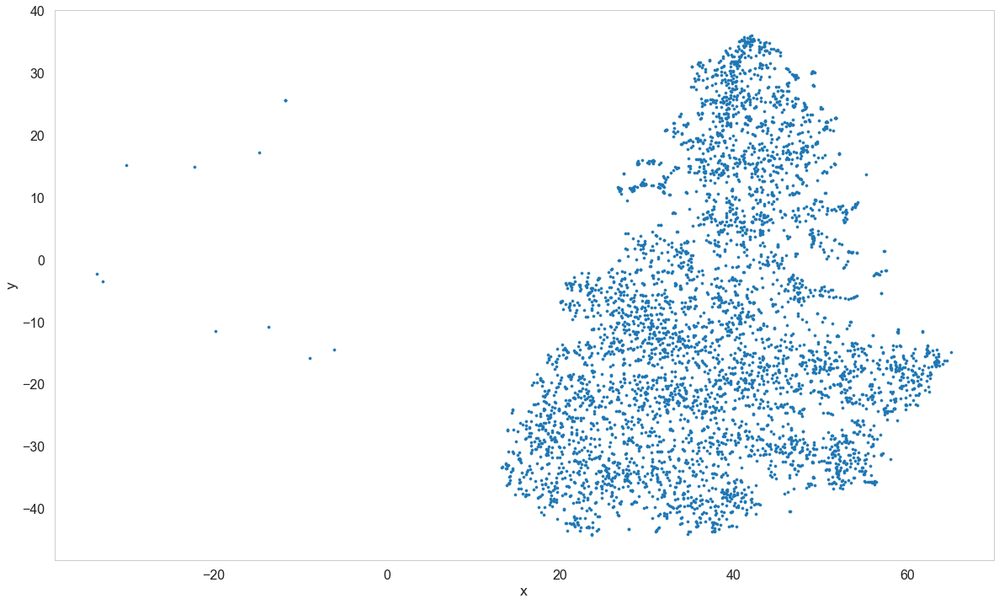

In [120]:
#Plot the word2vec visualisation
points.plot.scatter("x", "y", s=10, figsize=(20, 12), grid=False)


In [121]:
#Now do word check
#Method to search for words 
def search_words():
    process = True
    while process:
        try:
            searched_word = input("Please enter the word you wish to search: ")
            return searched_word
        except:
            print ("!!Invalid input data, please enter the right data")

#Enter word now
searched_word = search_words()


Please enter the word you wish to search: talk


In [122]:
#Most similar word check
try:
    a=word2vec_model.most_similar(searched_word)
    not_in_dict = 0
except:
    not_in_dict = 1
    print("Word is not in the word vec vocabulary")

C:\Users\User\Anaconda\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\User\Anaconda\lib\site-packages\gensim\matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


In [123]:
#Print the results
if not_in_dict == 1:
    print('Not available')
else:
    print(a)

[('presentation', 0.883034348487854), ('second', 0.8806511759757996), ('introduce', 0.8781733512878418), ('lecture', 0.8768491744995117), ('review', 0.8768426179885864), ('seminar', 0.8734092116355896), ('going', 0.8616107702255249), ('half', 0.8597474694252014), ('session', 0.8535256385803223), ('report', 0.851657509803772)]


In [124]:
#Set word as index
try:
    points.set_index('word', inplace=True)
    points.head()
except:
    print ('Error')

# 4.2 A visualisation of all the word vectors (with their corresponding words) in the talk abstract.

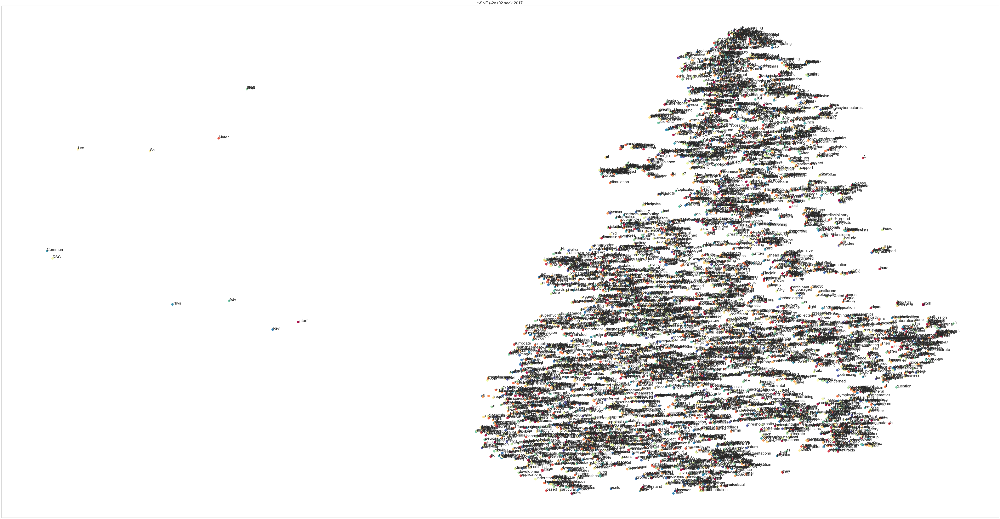

In [125]:
#Generates points and colour
n_points =len(points)
#Generates points and colour
X, color = datasets.samples_generator.make_s_curve(n_points, random_state=49)
    
#Now let's print out the t-SNE visualisation which incorporated tfidf and TruncatedSVD
fig = plt.figure(figsize=(500,100))
ax = fig.add_subplot(2, 5, 10)
for word, pos1 in points.iterrows():
     ax.annotate(word, pos1)
plt.scatter(points['x'], points['y'], c=color, cmap=plt.cm.Spectral )
plt.title("t-SNE (%.2g sec): " % (t1 - t0) + str(year_entered))
ax.xaxis.set_major_formatter(NullFormatter())
ax.yaxis.set_major_formatter(NullFormatter())
ax.grid(False)
  